# Cross-country equity futures strategy

This notebook illustrates the concepts discussed in the post “Cross-country Equity Futures Strategies” available on the Macrosynergy website.

The notebook evaluates five simple thematic and potentially differentiating macro scores across a panel of 16 developed and emerging markets. It demonstrates that even a basic, non-optimized composite score could have added substantial value beyond a risk-parity exposure to global equity index futures. Additionally, a purely relative value equity index futures strategy would have provided respectable long-term returns, complementing passive equity exposure.

The notebook explores both directional and relative equity futures strategies, including:
- Global Directional Futures Strategy, 
- Directional Futures Strategy for Developed Markets, 
- Global Relative Futures Strategy, and 
- Relative Futures Strategy for Developed Markets

## Get packages and JPMaQS data

In [6]:
# >>> Define constants <<< #
import os

# Retrieve credentials
client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

# Define any Proxy settings required (http/https)
PROXY = {}

# Start date for the data (argument passed to the JPMaQSDownloader class)
START_DATE = "2000-01-01"

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings
import os
from datetime import date

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn
import macrosynergy.visuals as msv
from macrosynergy.download import JPMaQSDownload

warnings.simplefilter("ignore")

The JPMaQS indicators we consider are downloaded using the J.P. Morgan Dataquery API interface within the `macrosynergy` package. This is done by specifying ticker strings, formed by appending an indicator category code <category> to a currency area code <cross_section>. These constitute the main part of a full quantamental indicator ticker, taking the form `DB(JPMAQS,<cross_section>_<category>,<info>)`, where <info> denotes the time series of information for the given cross-section and category. The following types of information are available:

`value` giving the latest available values for the indicator
`eop_lag` referring to days elapsed since the end of the observation period
`mop_lag` referring to the number of days elapsed since the mean observation period
`grade` denoting a grade of the observation, giving a metric of real time information quality.

After instantiating the `JPMaQSDownload` class within the `macrosynergy.download` module, one can use the `download(tickers,start_date,metrics)` method to easily download the necessary data, where `tickers` is an array of ticker strings, `start_date` is the first collection date to be considered and `metrics` is an array comprising the times series information to be downloaded. For more information see [here](https://github.com/macrosynergy/macrosynergy/blob/develop/README.md)

In [8]:
# Cross-sections of interest

cids_dmeq = ["AUD", "CAD", "CHF", "EUR", "GBP", "JPY", "SEK", "USD"]
cids_eueq = ["DEM", "ESP", "FRF", "ITL", "NLG"]
cids_aseq = ["CNY", "HKD", "INR", "KRW", "MYR", "SGD", "THB", "TWD"]
cids_exeq = ["BRL", "TRY", "ZAR"]
cids_nueq = ["MXN", "PLN"]

cids_eq = sorted(cids_dmeq + cids_eueq + cids_aseq + cids_exeq + cids_nueq)
cids_eqxe = sorted(list(set(cids_eq) - set(cids_eueq)))
cids_eqxx = sorted(list(set(cids_eqxe) - set(["CNY", "TRY", "PLN", "HKD", "SGD"])))
cids_eqxu = sorted(list(set(cids_eqxx) - set(["USD"])))
cids = cids_eq

In [9]:
# Category tickers

inf = [
    "CPIH_SA_P1M1ML12",
    "CPIH_SJA_P6M6ML6AR",
    "CPIC_SA_P1M1ML12",
    "CPIC_SJA_P6M6ML6AR",
    "INFTEFF_NSA",
]
lab = [
    "EMPL_NSA_P1M1ML12_3MMA",
    "EMPL_NSA_P1Q1QL4",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_NSA_D1Q1QL4",
    "WFORCE_NSA_P1Y1YL1_5YMA",
    "WFORCE_NSA_P1Q1QL4_20QMM",
]
ofx = [
    "REEROADJ_NSA_P1M1ML12",
    "NEEROADJ_NSA_P1M1ML12",
    "REER_NSA_P1M1ML12",
]
fin = [
    "RIR_NSA", 
    "FXCRR_NSA", 
    "EQCRR_NSA", 
]
tot = [
    "CTOT_NSA_P1M1ML12",
    "MTOT_NSA_P1M1ML12",
]
add = [
    "RGDP_SA_P1Q1QL4_20QMM",
]

eco = inf + lab + ofx + fin + tot + add

mkt = [
    "EQXR_NSA",
    "EQXR_VT10",
    "FXTARGETED_NSA",
    "FXUNTRADABLE_NSA",
]

xcats = eco + mkt

# Resultant indicator tickers

tickers = [cid + "_" + xcat for cid in cids_eq for xcat in xcats]
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 624


The description of each JPMaQS category is available either under [Macro Quantamental Academy](https://academy.macrosynergy.com/quantamental-indicators/), or on [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected). In particular, the set used for this notebook is using [Consumer price inflation trends](https://macrosynergy.com/academy/notebooks/consumer-price-inflation-trends/), [Inflation targets](https://macrosynergy.com/academy/notebooks/inflation-targets/), [Labor market dynamics](https://macrosynergy.com/academy/notebooks/labor-market-dynamics/), [Demographic trends](https://macrosynergy.com/academy/notebooks/demographic-trends/), [Openness-adjusted effective appreciation](https://macrosynergy.com/academy/notebooks/openness-adjusted-effective-appreciation/), [Equity index future carry](https://macrosynergy.com/academy/notebooks/equity-index-future-carry/), [FX forward carry](https://macrosynergy.com/academy/notebooks/fx-forward-carry/), [Real interest rates](https://macrosynergy.com/academy/notebooks/real-interest-rates/), [GDP growth](https://macrosynergy.com/academy/notebooks/gdp-growth/), [Terms-of-trade](https://macrosynergy.com/academy/notebooks/terms-of-trade/), [Equity index future returns](https://macrosynergy.com/academy/notebooks/equity-index-future-returns/), and [FX tradeability and flexibility](https://macrosynergy.com/academy/notebooks/fx-tradeability-and-flexibility/)

In [10]:
# Download from DataQuery
with JPMaQSDownload(
    client_id=client_id, client_secret=client_secret
) as downloader:
    df: pd.DataFrame = downloader.download(
        tickers=tickers,
        start_date=START_DATE,
        metrics=["value"],
        suppress_warning=True,
        show_progress=True,
        report_time_taken=True,
        proxy=PROXY,
    )

Timestamp UTC:  2025-03-05 16:08:23
Connection successful!


Requesting data: 100%|██████████| 32/32 [00:06<00:00,  4.96it/s]


Time taken to download data: 	23.35 seconds.
Some expressions are missing from the downloaded data. Check logger output for complete list.
161 out of 624 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 6570 dates are missing.


In [11]:
dfx = df.copy()
dfx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2907609 entries, 0 to 2907608
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 88.7+ MB


## Availability and renaming

The [`check_availability()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#view-available-data-history-with-check-availability) function in `macrosynergy.management` displays the start dates from which each category is available for each requested country, as well as missing dates or unavailable series.

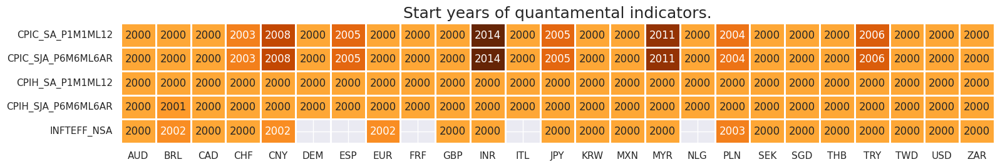

In [12]:
xcatx = inf
msm.check_availability(df=df, xcats=xcatx, cids=cids, missing_recent=False)

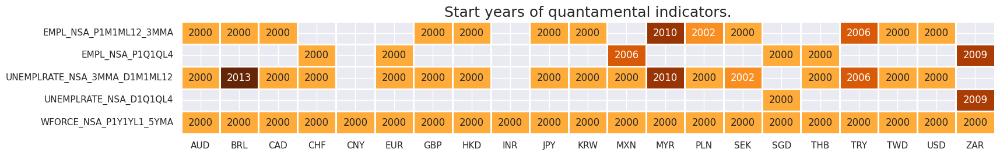

In [13]:
xcatx = lab
msm.check_availability(df=df, xcats=xcatx, cids=cids, missing_recent=False)

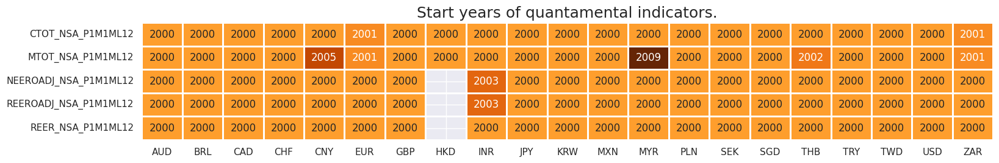

In [14]:
xcatx = ofx + tot
msm.check_availability(df=df, xcats=xcatx, cids=cids, missing_recent=False)

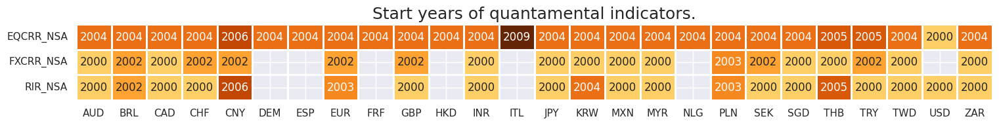

In [15]:
xcatx = fin
msm.check_availability(df=df, xcats=xcatx, cids=cids, missing_recent=False)

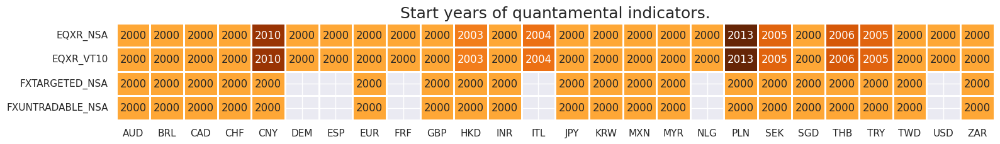

In [16]:
xcatx = mkt
msm.check_availability(df=df, xcats=xcatx, cids=cids, missing_recent=False)

### Renaming

For the purpose of the below presentation, we have renamed quarterly-frequency indicators to approximate monthly equivalents in order to have a full panel of similar measures across most countries. The two series are not identical but are close substitutes.

In [17]:
# Unify quarterly and 3-month moving average names

dict_repl = {
    "EMPL_NSA_P1Q1QL4": "EMPL_NSA_P1M1ML12_3MMA",
    "WFORCE_NSA_P1Q1QL4_20QMM": "WFORCE_NSA_P1Y1YL1_5YMM",
    "UNEMPLRATE_NSA_D1Q1QL4": "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_SA_D1Q1QL1": "UNEMPLRATE_SA_D3M3ML3",
}

for key, value in dict_repl.items():
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)

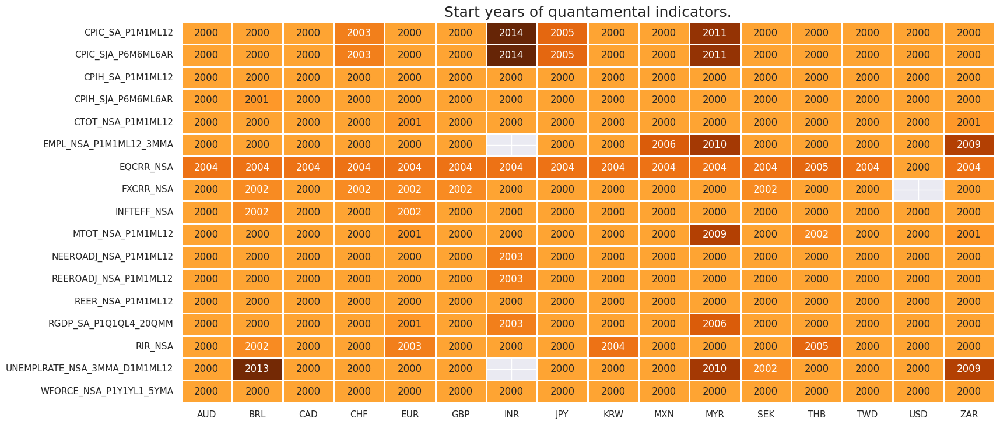

In [18]:
# Display availability of re-named and unified indicators

xcatx = eco
msm.check_availability(df=dfx, xcats=xcatx, cids=cids_eqxx, missing_recent=False)

### Blacklisting

Before running the analysis, we use [`make_blacklist()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#exclude-series-sections-with-make-blacklist) helper function from `macrosynergy` package, which creates a standardized dictionary of blacklist periods, i.e. periods that affect the validity of an indicator, based on standardized panels of binary categories.

Put simply, this function allows converting category variables into blacklist dictionaries that can then be passed to other functions. Below, we picked two indicators for FX tradability and flexibility. `FXTARGETED_NSA` is an exchange rate target dummy, which takes a value of 1 if the exchange rate is targeted through a peg or any regime that significantly reduces exchange rate flexibility and 0 otherwise. `FXUNTRADABLE_NSA` is also a dummy variable that takes the value one if liquidity in the main FX forward market is limited or there is a distortion between tradable offshore and untradable onshore contracts.

In [19]:
# Create blacklisting dictionary

dfb = df[df["xcat"].isin(["FXTARGETED_NSA", "FXUNTRADABLE_NSA"])].loc[
    :, ["cid", "xcat", "real_date", "value"]
]
dfba = (
    dfb.groupby(["cid", "real_date"])
    .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
    .reset_index()
)
dfba["xcat"] = "FXBLACK"
fxblack = msp.make_blacklist(dfba, "FXBLACK")
fxblack

{'BRL': (Timestamp('2012-12-03 00:00:00'), Timestamp('2013-09-30 00:00:00')),
 'CHF': (Timestamp('2011-10-03 00:00:00'), Timestamp('2015-01-30 00:00:00')),
 'CNY': (Timestamp('2000-01-03 00:00:00'), Timestamp('2025-03-04 00:00:00')),
 'HKD': (Timestamp('2000-01-03 00:00:00'), Timestamp('2025-03-04 00:00:00')),
 'INR': (Timestamp('2000-01-03 00:00:00'), Timestamp('2004-12-31 00:00:00')),
 'MYR_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('2007-11-30 00:00:00')),
 'MYR_2': (Timestamp('2018-07-02 00:00:00'), Timestamp('2025-03-04 00:00:00')),
 'SGD': (Timestamp('2000-01-03 00:00:00'), Timestamp('2025-03-04 00:00:00')),
 'THB': (Timestamp('2007-01-01 00:00:00'), Timestamp('2008-11-28 00:00:00')),
 'TRY_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('2003-09-30 00:00:00')),
 'TRY_2': (Timestamp('2020-01-01 00:00:00'), Timestamp('2024-07-31 00:00:00'))}

## Transformations and checks

### Thematic feature groups

#### Inflation shortfall

Most quantamental indicators that professional investment managers would deploy require careful customization and transformations of original JPMaQS data. Since all quantamental data are standardized information states over a range of countries, transformations are simple.

The [`panel_calculator()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#create-new-category-panels-with-panel-calculator) function in `macrosynergy.panel` makes it easy and intuitive to apply a wide range of transformations to each cross section of a panel by using a string. Below we calculate plausible metrics of excess inflation versus a country's effective inflation target. [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df) function adds the new indicators to the original dataframe `dfx`.

In [20]:
# Calculate negative excess inflation rates

# Preparation: for relative target deviations, we need denominator bases that should never be less than 2
infs = [i for i in inf if i[:5] in ["CPIH_", "CPIC_"]]
xcatx = infs
cidx =cids_eqxx

# calculate negative excess inflation rates
calcs = []
calcs += ["INFTEBASIS = INFTEFF_NSA.clip(lower=2) "]
for xc in xcatx:
    calcs += [f"X{xc}_NEG = - {xc} + INFTEFF_NSA "]
    calcs += [f"X{xc}_NEGRAT = X{xc}_NEG / INFTEBASIS "]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

# Collect in factor dictionary
dict_factors = {}  # Create dictionary to store factors

xinfs = list(dfa['xcat'].unique())
xinf_negs = [x for x in xinfs if x.endswith("_NEGRAT")]
dict_factors["XINF_NEG"] = xinf_negs

The macrosynergy package provides two useful functions, [`view_ranges()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-distributions-with-view-ranges) and [`view_timelines()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-time-series-with-view-timelines), which assist in plotting means, standard deviations, and time series of the chosen indicators.

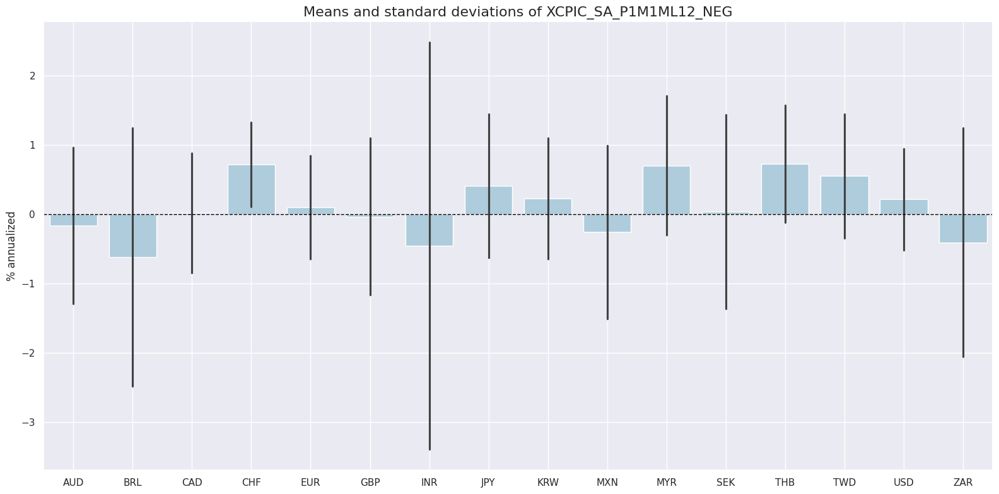

In [21]:
cidx = cids_eqxx
xcatx = [x for x in xinfs if x.startswith("XCPIC_SA_P1M1ML12")]

msp.view_ranges(
    dfx,
    xcats=[xcatx[0]],
    kind="bar",
    title=f"Means and standard deviations of {xcatx[0]}",
    ylab="% annualized",
    start="2000-01-01",
)

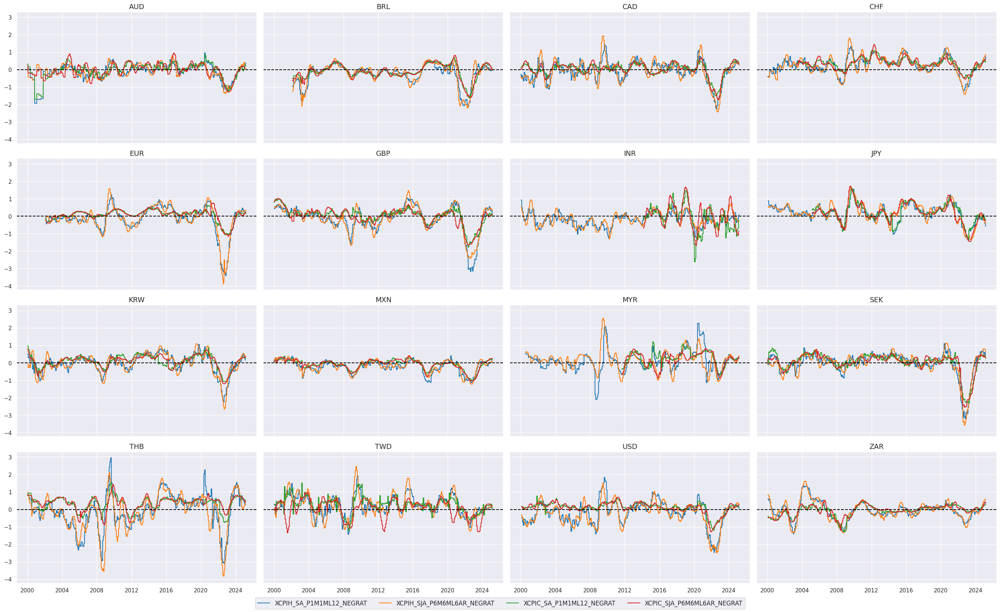

In [22]:
cidx = cids_eqxx
xcatx = xinf_negs

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

#### Labor market slackening


To understand how the business cycle affects employment growth, we measure the deviation of current employment growth from the long-term workforce median, known as "excess employment growth." This isolates the portion of growth due to the business cycle, revealing deviations from the long-term trend. The following cell calculates the negative of "excess employment growth" to analyze the impact of negative deviations.

In [23]:
# Calculate indicators of labor market tightening or tightness

cidx = cids_eqxx

calcs = [
    "XEMPL_NSA_P1M1ML12_3MMA_NEG = - EMPL_NSA_P1M1ML12_3MMA + WFORCE_NSA_P1Y1YL1_5YMA",
]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

# Collect in factor dictionary

lab_slacks = [
    "XEMPL_NSA_P1M1ML12_3MMA_NEG",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
]
dict_factors["LAB_SLACK"] = lab_slacks

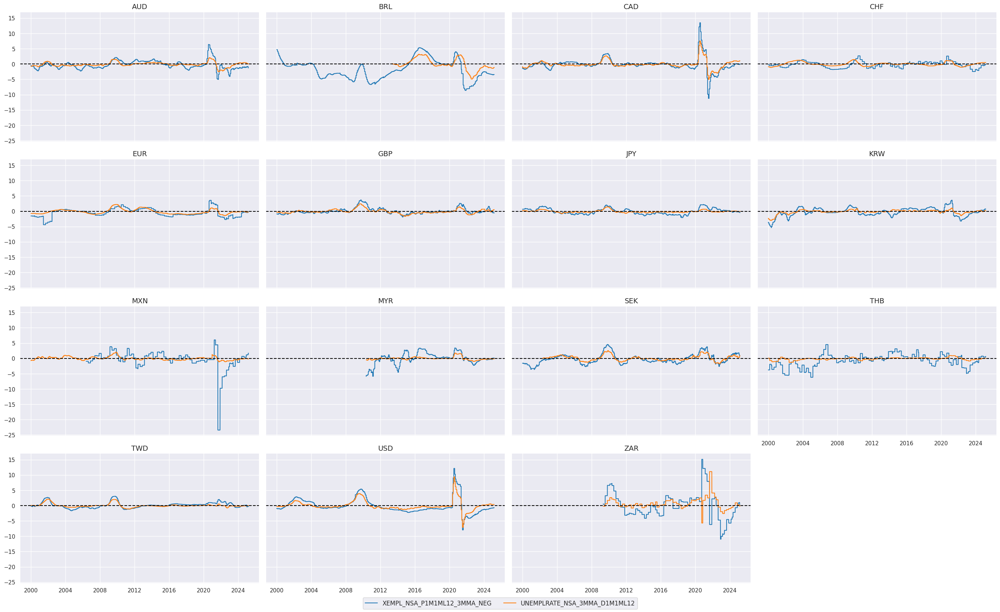

In [24]:
cidx = cids_eqxx
xcatx = lab_slacks

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

#### Effective currency depreciation

In [25]:
# Calculate the negatives of openness-adjusted effective real appreciation collected previously in the list ofx

xcatx = ofx
cidx = cids_eqxx

calcs = []
for xc in xcatx:
    calc = [f"X{xc}_NEG = - {xc}"]
    calcs.extend(calc)

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

# Collect in factor dictionary

fx_deprecs = list(dfa['xcat'].unique())
dict_factors["FX_DEPREC"] = fx_deprecs

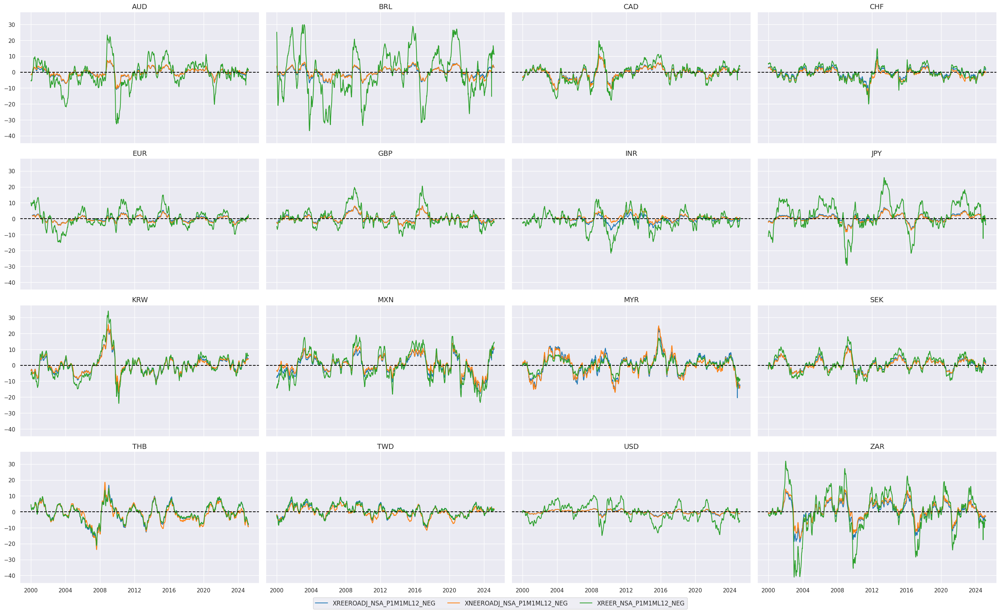

In [26]:
cidx = cids_eqxx
xcatx = fx_deprecs

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

#### Ease of local finance

The idea behind this theme is simply that accommodative local financial conditions support demand for equity. The theme is represented by two indicators:
-  The first is the negative of an excess real short-term interest rate, which is calculated as the difference between a real expectations-based short-term interest rate [(view documentation)]((https://macrosynergy.com/academy/notebooks/real-interest-rates/)(https://macrosynergy.com/academy/notebooks/real-interest-rates/)) and estimated productivity growth, whereby the latter is approximated by the difference between a [GDP growth trend](https://macrosynergy.com/academy/notebooks/gdp-growth/) and [work force growth trend](https://macrosynergy.com/academy/notebooks/demographic-trends/). 
- The second indicators excess real equity carry based on the difference between (i) average of expected forward dividend and earnings yield and (ii) the main local-currency real short-term interest rate, in % annualized of notional of the contract (view documentation). Excess here means above 3.5%, a judgment call assuming that for equity carry to be attractive it needs to excess at least 20% of long-term average index future volatility.

In [27]:
# Calculate ease-of-financing indicators
cidx = cids_eqxx

calcs = [
    "XRIR_NSA_NEG = - RIR_NSA + RGDP_SA_P1Q1QL4_20QMM - WFORCE_NSA_P1Y1YL1_5YMA",
    "XEQCRR_NSA = EQCRR_NSA - 0.2 * 17.5"  # excess carry assuming equity vol of 17.5% and 0.2 minimum Sharpe
]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

# Collect in factor dictionary

ease_fins = list(dfa['xcat'].unique())
dict_factors["EASE_FIN"] = ease_fins

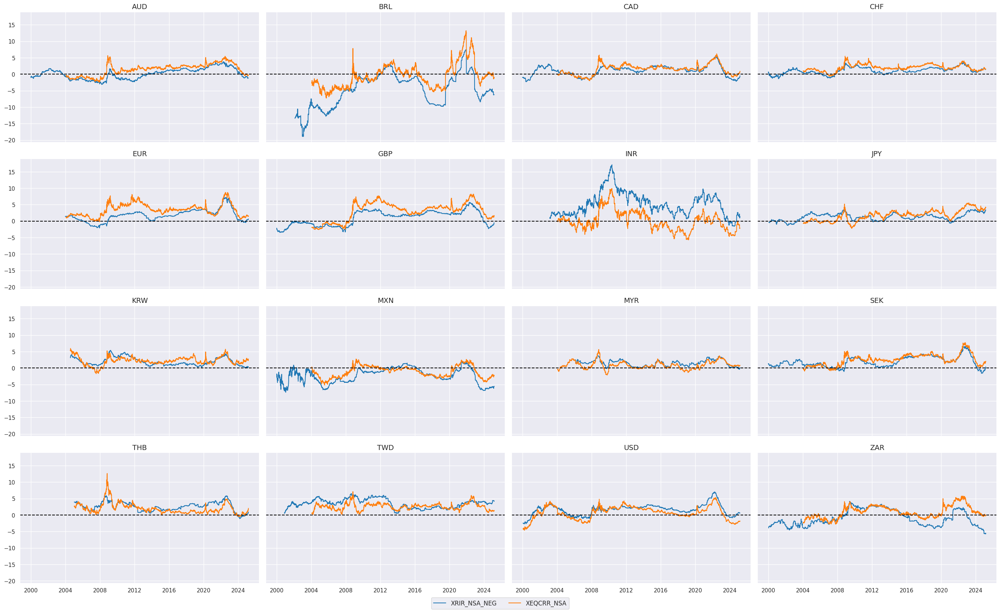

In [28]:
cidx = cids_eqxx
xcatx = ease_fins

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

#### Terms-of-trade improvement


The indicators for terms of trade improvement are directly accessible on JPMaQS and do not need any adjustments.

In [29]:
# Use annual terms-of-trade growth
tot_poya = ["CTOT_NSA_P1M1ML12", "MTOT_NSA_P1M1ML12"]

dict_factors["TOT_POYA"] = tot_poya

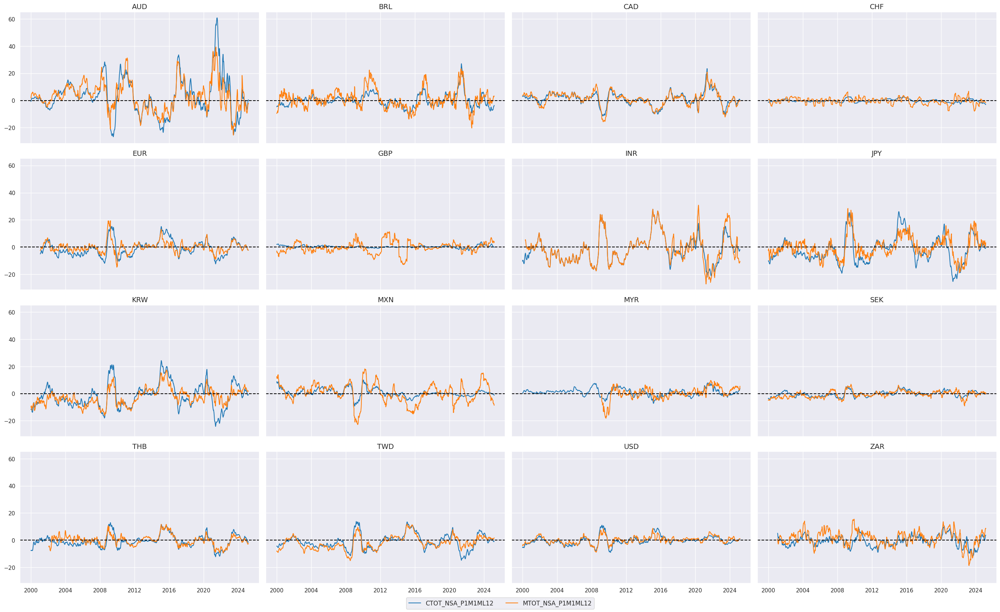

In [30]:
cidx = cids_eqxx
xcatx = tot_poya

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

### Composite features

#### Thematic scores

The [`make_zn_scores()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#normalize-panels-with-make-zn-scores) function is a method for normalizing values across different categories. This is particularly important when summing or averaging categories with different units and time series properties. The function computes z-scores for a category panel around a specified neutral level that may be different from the mean. The term "zn-score" refers to the normalized distance from the neutral value.

The default mode of the function calculates scores based on sequential estimates of means and standard deviations, using only past information. This is controlled by the `sequential=True` argument, and the minimum number of observations required for meaningful estimates is set with the `min_obs` argument. By default, the function calculates zn-scores for the initial sample period defined by `min_obs` on an in-sample basis to avoid losing history.

The means and standard deviations are re-estimated daily by default, but the frequency of re-estimation can be controlled with the `est_freq` argument, which can be set to weekly, monthly, or quarterly.


In [31]:
# Normalize thematic group members

cidx = cids_eqxx

xcatx = []
for key, value in dict_factors.items():
    xcatx.extend(value)  # list of all categories


dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,  # assumes comparable impact scales across cross-sections
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

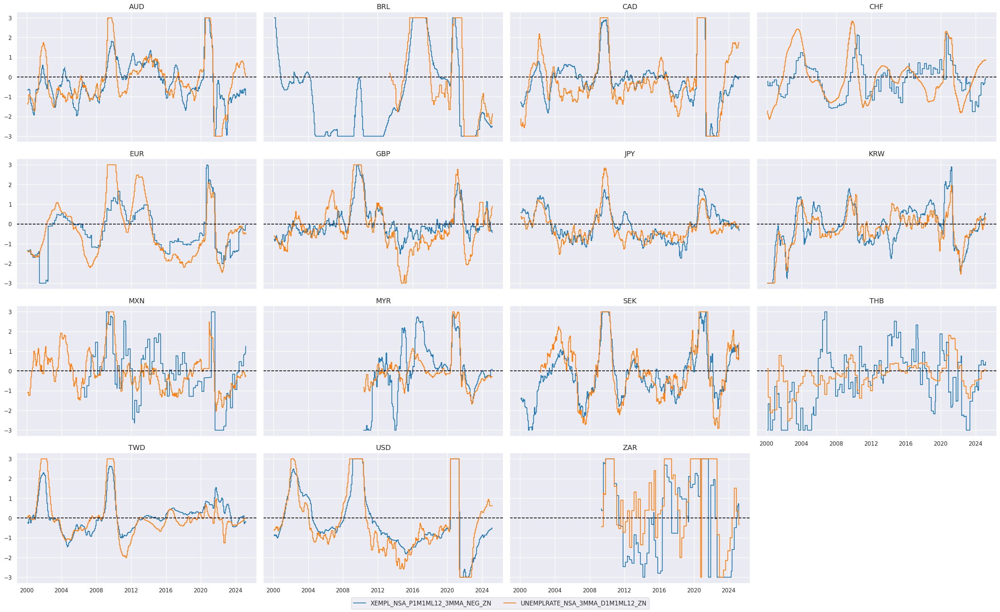

In [32]:
cidx = cids_eqxx
xcatx = [x + "_ZN" for x  in lab_slacks]  # dict_factors.keys()
msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

[linear_composite](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#calculate-linear-combinations-of-panels-with-linear-composite) function is designed to calculate linear combinations of different categories. It can produce a composite even if some of the component data are missing. This flexibility is valuable because it enables to work with the available information rather than discarding it entirely. This behavior is desirable if one works with a composite of a set of categories that capture a similar underlying factor. In this context, the function calculates simple averages of the factors listed in `dict_factors`.

In [33]:
# Combine to thematic composite thematic scores

cidx = cids_eqxx
dfa = pd.DataFrame(columns=list(dfx.columns))

for key, value in dict_factors.items():
    xcatx = [x + "_ZN" for x in value]
    dfaa = msp.linear_composite(
        df=dfx,
        xcats=xcatx,
        cids=cidx,
        complete_xcats=False,
        new_xcat=key,
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

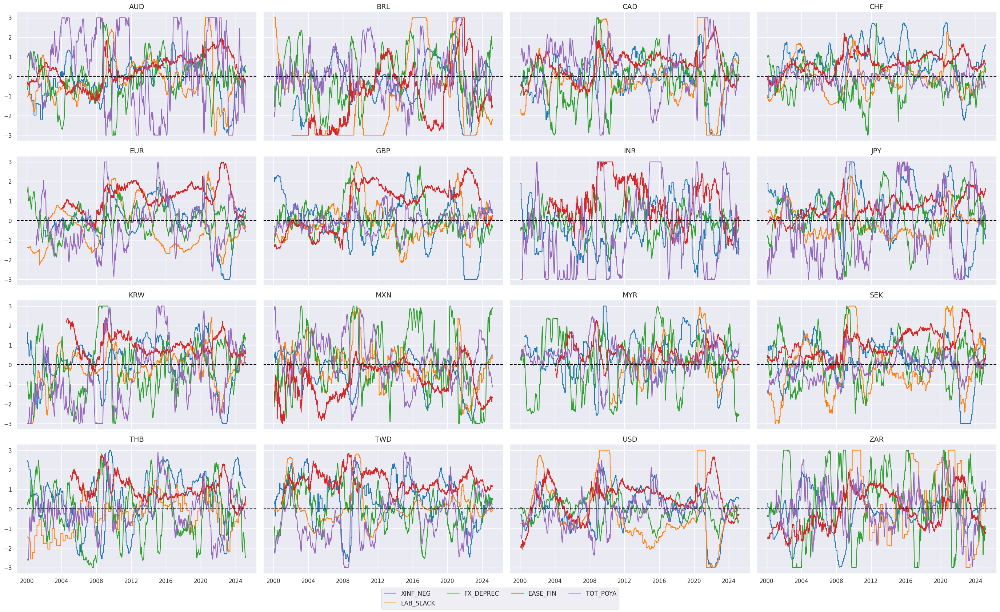

In [34]:
cidx = cids_eqxx
xcatx = list(dict_factors.keys())

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

In [35]:
# Re-score composites

cidx = cids_eqxx
xcatx = list(dict_factors.keys())

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,  # assumes comparable impact scales across cross-sections
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)
themz = [x + "_ZN" for x in list(dict_factors.keys())]

The below code defines a dictionary `dict_themes` with various macroeconomic themes and their descriptions, and then creates a list of the keys from this dictionary. This approach ensures that the labels associated with each theme are more readable and accessible. 

In [36]:
# Labelling dictionary

dict_themes = {}
dict_themes["ALL_MACRO_ZN"] = "All macro themes"
dict_themes["XINF_NEG_ZN"] = "Inflation shortfall"
dict_themes["LAB_SLACK_ZN"] = "Labor market slackening"
dict_themes["FX_DEPREC_ZN"] = "Effective currency depreciation"
dict_themes["EASE_FIN_ZN"] = "Ease of local finance"
dict_themes["TOT_POYA_ZN"] = "Terms of trade improvement"

macroz = list(dict_themes.keys())

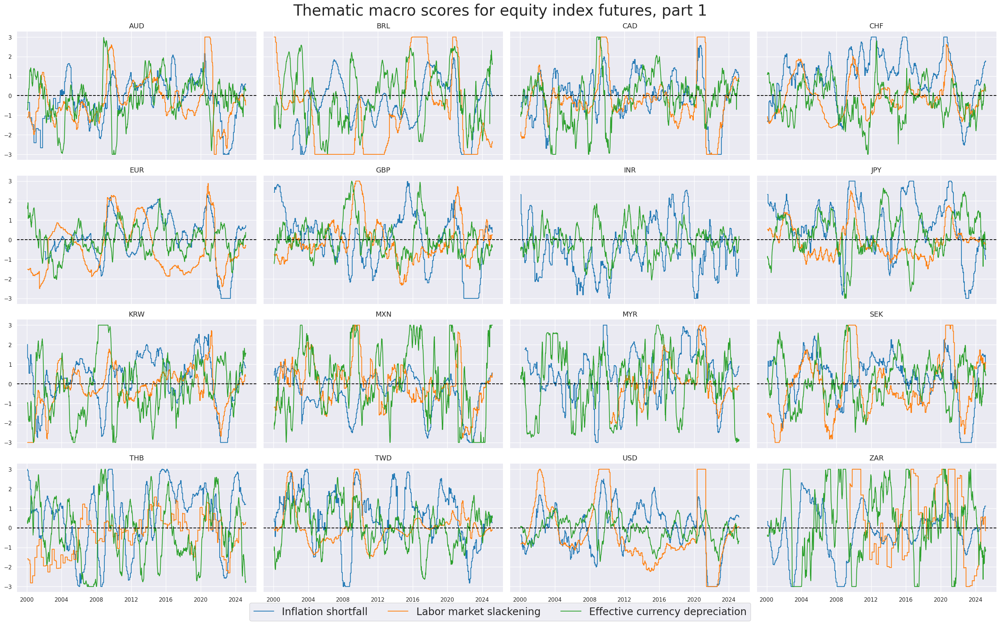

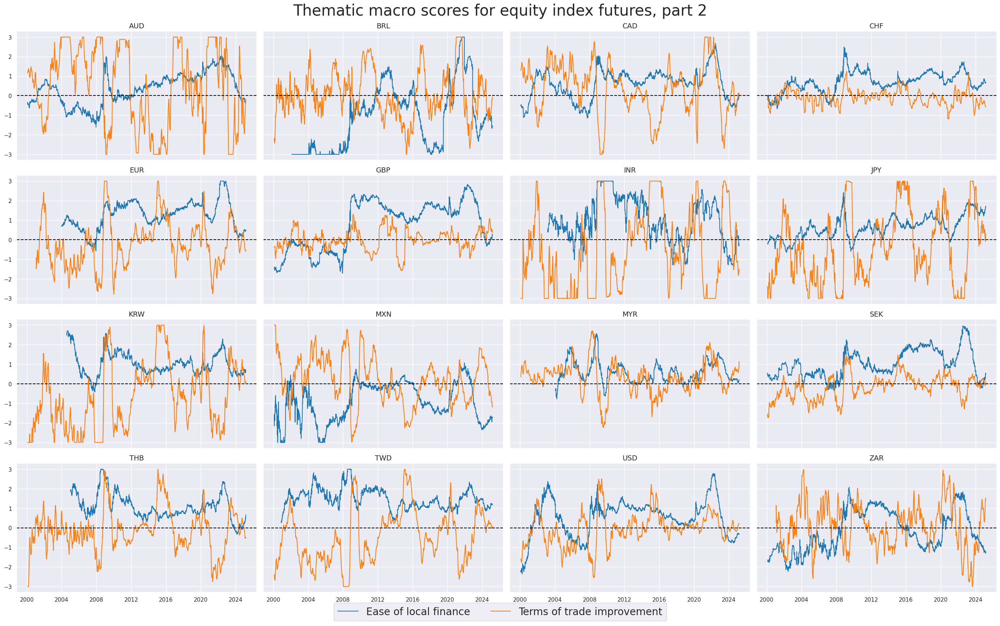

In [37]:
cidx = cids_eqxx
xcatx = themz[:3]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title="Thematic macro scores for equity index futures, part 1",
    title_fontsize=30,
    xcat_labels=[dict_themes[xc] for xc in xcatx],
    legend_fontsize=20,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

xcatx = themz[3:]
msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title="Thematic macro scores for equity index futures, part 2",
    title_fontsize=30,
    xcat_labels=[dict_themes[xc] for xc in xcatx],
    legend_fontsize=20,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

#### Grand total macro score

All five themes—Inflation shortfall, Labor market slackening, Effective currency depreciation, Ease of local finance, and Terms of trade improvement—are combined into a composite score using equal weights. This new indicator is standardized into a z-score and given the suffix `_ZN`, resulting in the label `ALL_MACRO_ZN`.There is no optimization involved. 

In [38]:
# Combine to grand total

cidx = cids_eqxx
xcatx = themz

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat="ALL_MACRO",
)
dfx = msm.update_df(dfx, dfa)

# Re-score

dfa = msp.make_zn_scores(
    dfx,
    xcat="ALL_MACRO",
    cids=cidx,
    sequential=True,
    min_obs=261 * 5,
    neutral="zero",
    pan_weight=1,  # assumes comparable impact scales across cross-sections
    thresh=3,
    postfix="_ZN",
    est_freq="m",
)
dfx = msm.update_df(dfx, dfa)

# Add to labelling dictionary

dict_themes["ALL_MACRO_ZN"] = "All macro themes" # updating dict_themes with the new indicator 

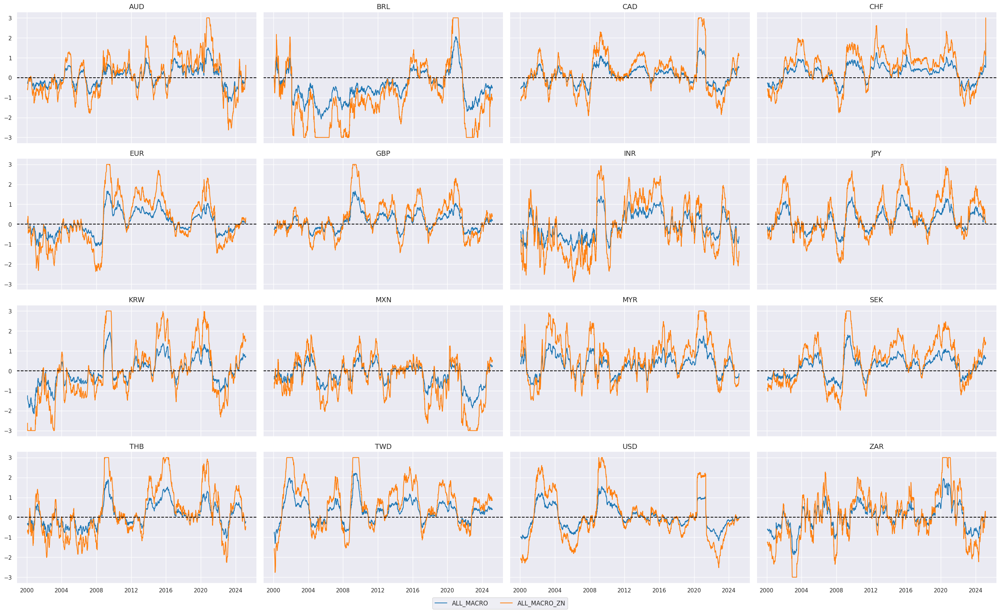

In [39]:
cidx = cids_eqxx
xcatx = ["ALL_MACRO", "ALL_MACRO_ZN"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

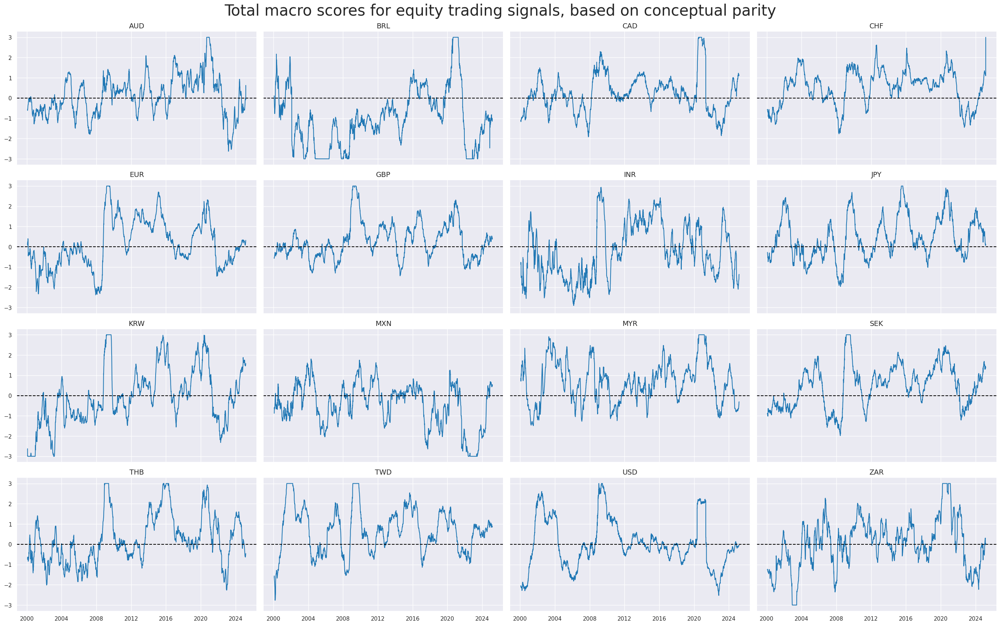

In [40]:
cidx = cids_eqxx
xcatx = ["ALL_MACRO_ZN"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title="Total macro scores for equity trading signals, based on conceptual parity",
    title_fontsize=30,
    xcat_labels=[dict_themes[xc] for xc in xcatx],
    legend_fontsize=20,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

### Relative scores

#### DM basket

The convenience function [`make_relative_value()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#compute-panels-versus-basket-with-make-relative-value) of the `macrosynergy.panel` module calculates values relative to an equally-weighted basket of developed market currencies, which are specified in the list `cids_dmeq`, while adapting to missing periods of any of the basket cross sections. [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df) function in the `macrosynergy` management module concatenates two JPMaQS data frames, effectively adding the newly calculated relative indicators with postfix `vDM`.

In [41]:
cidx = cids_dmeq
xcatx = macroz

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    blacklist=fxblack,  # cross-sections can be blacklisted for calculation and basket use
    rel_meth="subtract",
    complete_cross=False,  # cross-sections do not have to be complete for basket calculation
    postfix="vDM",
)
dfx = msm.update_df(dfx, dfa)

macroz_vdm = [x + "vDM" for x in macroz]

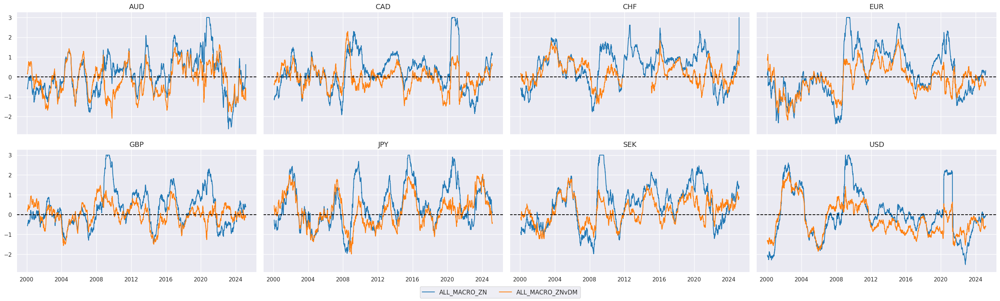

In [42]:
macro = macroz[0]  # check composite score
cidx = cids_dmeq
xcatx = [macro, f"{macro}vDM"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

#### Global basket

The `make_relative_value()` function from the `macrosynergy.panel` module calculates values relative to an equally-weighted basket of available market `cids_eqxx`. This basket includes all available market cross-sections and adapts to any missing periods within these cross-sections. The newly generated global relative indicators are then appended with the postfix `vGM`, differentiating them from the relative indicator calculated earlier.

In [43]:
cidx = cids_eqxx
xcatx = macroz

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    blacklist=fxblack,  # cross-sections can be blacklisted for calculation and basket use
    rel_meth="subtract",
    complete_cross=False,  # cross-sections do not have to be complete for basket calculation
    postfix="vGM",
)
dfx = msm.update_df(dfx, dfa)

macroz_vgm = [x + "vGM" for x in macroz]

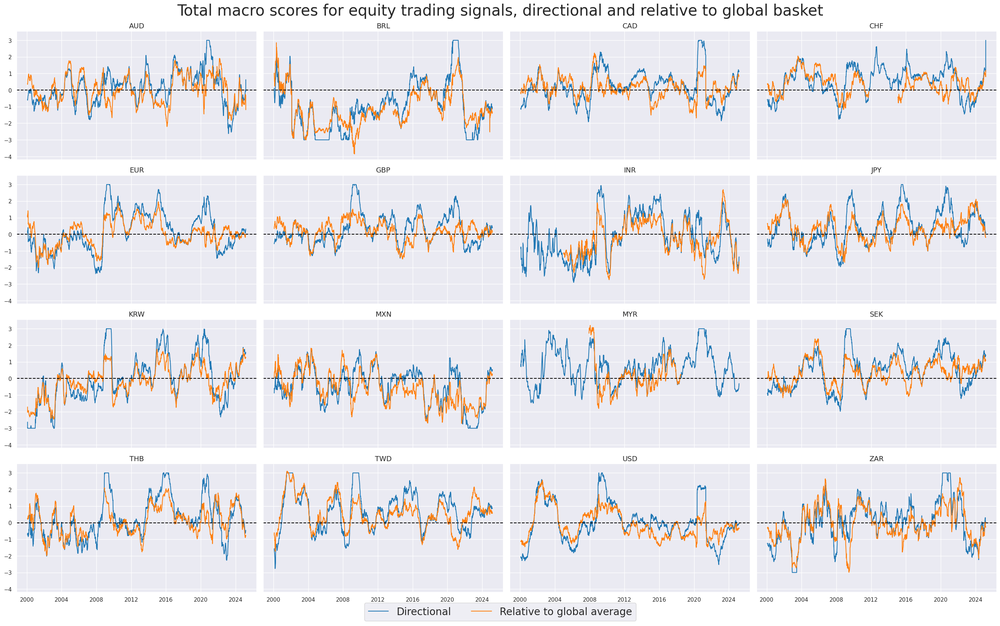

In [44]:
macro = macroz[0]  # pick a composite score
cidx = cids_eqxx
xcatx = [macro, f"{macro}vGM"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title="Total macro scores for equity trading signals, directional and relative to global basket",
    title_fontsize=30,
    xcat_labels=["Directional", "Relative to global average"],
    legend_fontsize=20,
    ncol=4,
    start="2000-01-01",
    same_y=True,
)

## Target returns

### Outright equity index returns

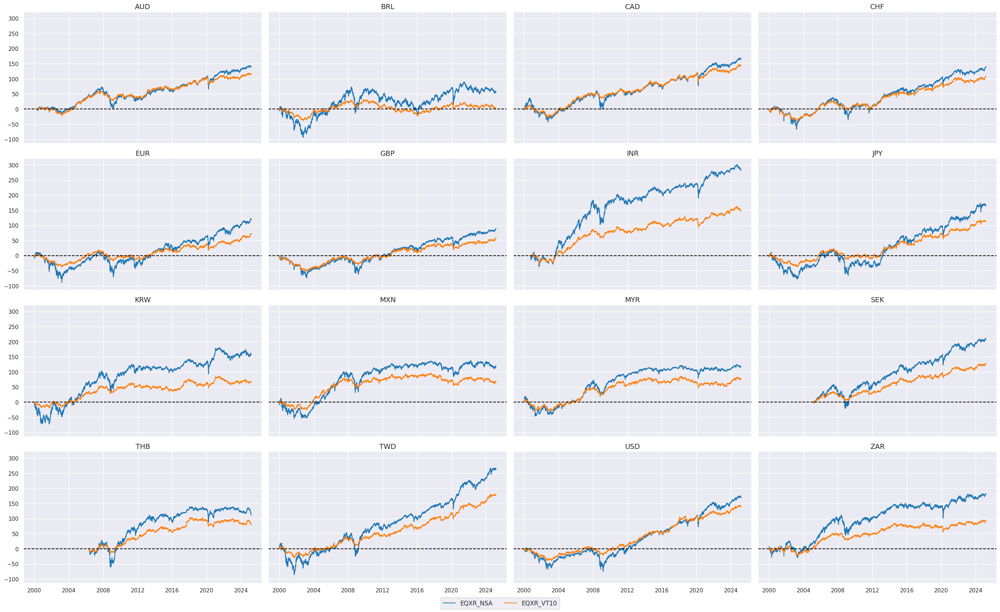

In [45]:
cidx = cids_eqxx
xcatx = ["EQXR_NSA", "EQXR_VT10"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
    cumsum=True,
)

### Relative equity index returns

#### DM basket

The code below calculates relative values for equity index futures relative to a basket of all available market currencies specified in the list `cids_dmeq`. The newly calculated relative indicators are assigned the suffix `vDM`.

In [46]:
cidx = cids_dmeq
xcatx = ["EQXR_NSA", "EQXR_VT10"]

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    blacklist=fxblack,  # cross-sections can be blacklisted for calculation and basket use
    rel_meth="subtract",
    complete_cross=False,  # cross-sections do not have to be complete for basket calculation
    postfix="vDM",
)
dfx = msm.update_df(dfx, dfa)

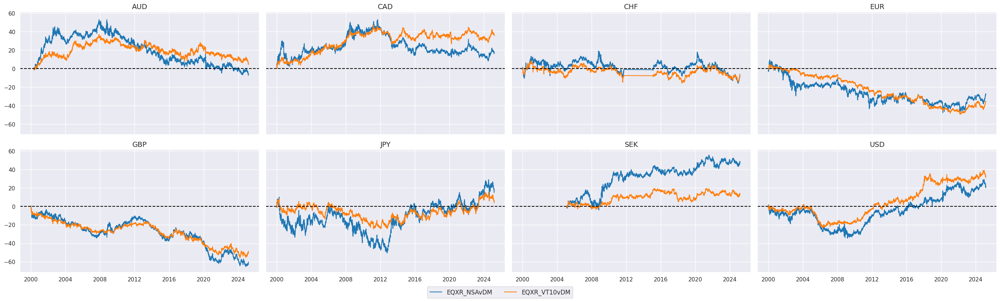

In [47]:
cidx = cids_dmeq
xcatx = ["EQXR_NSAvDM", "EQXR_VT10vDM"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
    cumsum=True,
)

#### Global basket

The code below calculates relative values for equity index futures relative to a basket of all available market currencies specified in the list `cids_eqxx`. The newly calculated relative indicators are assigned the suffix `vGM`.


In [48]:
cidx = cids_eqxx
xcatx = ["EQXR_NSA", "EQXR_VT10"]

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    blacklist=fxblack,  # cross-sections can be blacklisted for calculation and basket use
    rel_meth="subtract",
    complete_cross=False,  # cross-sections do not have to be complete for basket calculation
    postfix="vGM",
)
dfx = msm.update_df(dfx, dfa)

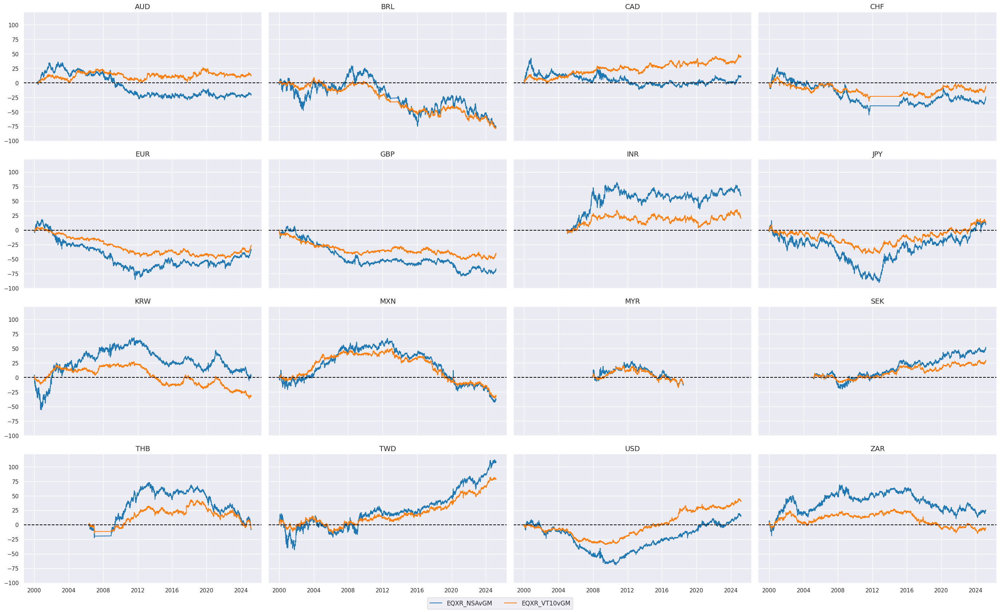

In [49]:
cidx = cids_eqxx
xcatx = ["EQXR_NSAvGM", "EQXR_VT10vGM"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=True,
    cumsum=True,
)

## Value checks

### Global directional futures strategy

#### Specs and panel test

We start by defining a dictionary with the key parameters necessary for evaluating a specific type of strategy. This includes setting the signals, target returns, cross-sections, initial date, and blacklistings for evaluating a global directional futures strategy. 

In [50]:
dict_deq_gm = {
    "sigs": macroz,
    "targs": ["EQXR_NSA", "EQXR_VT10"],
    "cidx": cids_eqxx,
    "start": "2000-01-01",
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

Instances of the [`CategoryRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#investigate-relations-between-panels-with-categoryrelations) class from the `macrosynnergy.panel` package are designed to organize panels of features and targets into formats suitable for analysis. This class provides functionalities for frequency conversion, adding lags, and trimming outliers. 

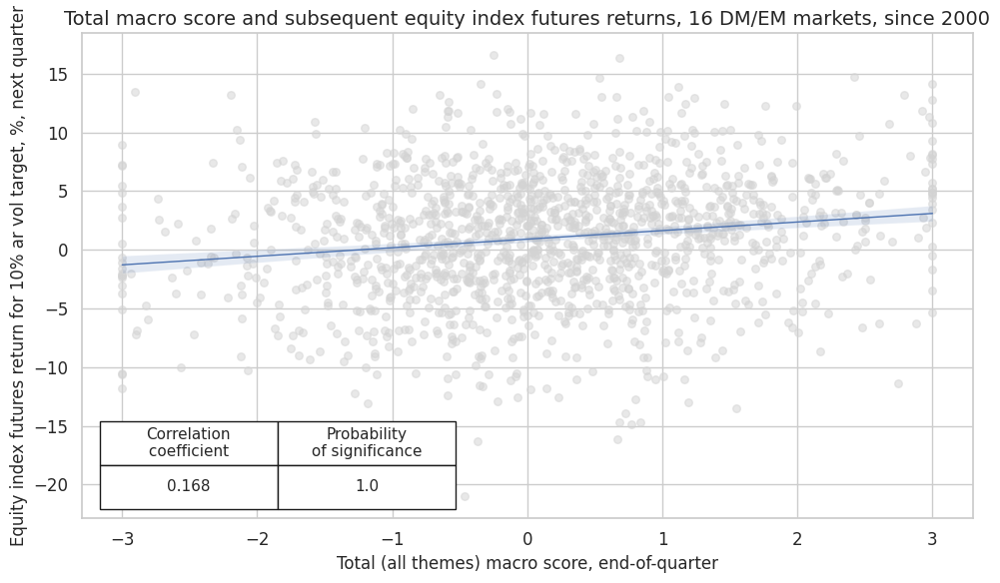

In [51]:
dix = dict_deq_gm

sig = dix["sigs"][0]
targ = dix["targs"][1]
blax = dix["black"]
cidx = dix["cidx"]
start = dix["start"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
cr.reg_scatter(
    labels=False,
    coef_box="lower left",
    title="Total macro score and subsequent equity index futures returns, 16 DM/EM markets, since 2000",
    xlab="Total (all themes) macro score, end-of-quarter",
    ylab="Equity index futures return for 10% ar vol target, %, next quarter",
    size=(10, 6),
    prob_est="map",
)

`multiple_reg_scatter()` method allows comparison of several pairs of two categories relationships side by side, including the strength of the linear association and any potential outliers. 

LAB_SLACK_ZN misses: ['INR'].


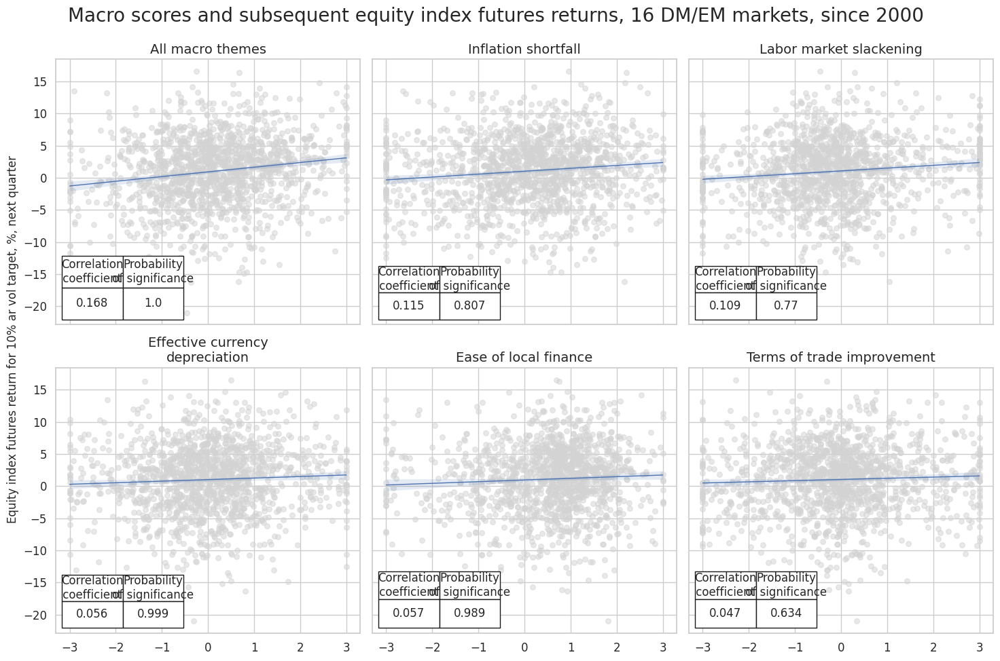

In [52]:
dix = dict_deq_gm

sigs = dix["sigs"]
targ = dix["targs"][1] # assuming just one target
blax = dix["black"]
cidx = dix["cidx"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title="Macro scores and subsequent equity index futures returns, 16 DM/EM markets, since 2000",
    ylab="Equity index futures return for 10% ar vol target, %, next quarter",
    ncol=3,
    nrow=2,
    figsize=(15, 10),
    prob_est="map",
    coef_box="lower left",
    subplot_titles=[dict_themes[k] for k in crs_keys],
)

#### Accuracy and correlation check

Please refer to the [`SignalReturnRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#signalreturnrelations) class of the `macrosynergy.signal` module for details on the code below.

In [53]:
dix = dict_deq_gm

sigx = dix["sigs"]
targx = dix["targs"]
cidx = dix["cidx"]
start = dix["start"]
blax = dix["black"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [54]:
dix = dict_deq_gm
srr = dix["srr"]
display(srr.multiple_relations_table().astype("float").round(3))

accuracy  bal_accuracy  \
Return    Signal       Frequency Aggregation                           
EQXR_NSA  ALL_MACRO_ZN M         last            0.540         0.533   
          EASE_FIN_ZN  M         last            0.559         0.524   
          FX_DEPREC_ZN M         last            0.513         0.515   
          LAB_SLACK_ZN M         last            0.481         0.499   
          TOT_POYA_ZN  M         last            0.510         0.514   
          XINF_NEG_ZN  M         last            0.535         0.524   
EQXR_VT10 ALL_MACRO_ZN M         last            0.540         0.533   
          EASE_FIN_ZN  M         last            0.560         0.524   
          FX_DEPREC_ZN M         last            0.513         0.515   
          LAB_SLACK_ZN M         last            0.481         0.499   
          TOT_POYA_ZN  M         last            0.510         0.514   
          XINF_NEG_ZN  M         last            0.535         0.524   

                                              pos_sigr  pos_retr  pos_prec  \
Return    Signal       Frequency Aggregation                                 
EQXR_NSA  ALL_MACRO_ZN M         last            0.545     0.584     0.614   
          EASE_FIN_ZN  M         last            0.729     0.589     0.601   
          FX_DEPREC_ZN M         last            0.491     0.584     0.599   
          LAB_SLACK_ZN M         last            0.396     0.586     0.584   
          TOT_POYA_ZN  M         last            0.475     0.584     0.600   
          XINF_NEG_ZN  M         last            0.567     0.586     0.607   
EQXR_VT10 ALL_MACRO_ZN M         last            0.545     0.584     0.614   
          EASE_FIN_ZN  M         last            0.729     0.589     0.602   
          FX_DEPREC_ZN M         last            0.491     0.584     0.599   
          LAB_SLACK_ZN M         last            0.396     0.586     0.585   
          TOT_POYA_ZN  M         last            0.475     0.585     0.600   
          XINF_NEG_ZN  M         last            0.567     0.586     0.607   

                                              neg_prec  pearson  pearson_pval  \
Return    Signal       Frequency Aggregation                                    
EQXR_NSA  ALL_MACRO_ZN M         last            0.451    0.126         0.000   
          EASE_FIN_ZN  M         last            0.446    0.044         0.005   
          FX_DEPREC_ZN M         last            0.430    0.041         0.007   
          LAB_SLACK_ZN M         last            0.413    0.075         0.000   
          TOT_POYA_ZN  M         last            0.429    0.052         0.001   
          XINF_NEG_ZN  M         last            0.441    0.084         0.000   
EQXR_VT10 ALL_MACRO_ZN M         last            0.451    0.103         0.000   
          EASE_FIN_ZN  M         last            0.446    0.031         0.042   
          FX_DEPREC_ZN M         last            0.430    0.024         0.108   
          LAB_SLACK_ZN M         last            0.413    0.064         0.000   
          TOT_POYA_ZN  M         last            0.429    0.037         0.016   
          XINF_NEG_ZN  M         last            0.441    0.080         0.000   

                                              kendall  kendall_pval    auc  
Return    Signal       Frequency Aggregation                                
EQXR_NSA  ALL_MACRO_ZN M         last           0.068         0.000  0.533  
          EASE_FIN_ZN  M         last           0.037         0.000  0.519  
          FX_DEPREC_ZN M         last           0.027         0.007  0.515  
          LAB_SLACK_ZN M         last           0.033         0.002  0.499  
          TOT_POYA_ZN  M         last           0.020         0.052  0.515  
          XINF_NEG_ZN  M         last           0.041         0.000  0.524  
EQXR_VT10 ALL_MACRO_ZN M         last           0.063         0.000  0.533  
          EASE_FIN_ZN  M         last           0.027         0.009  0.520  
          FX_DEPREC_ZN M         last  

#### Naive PnL

The [`NaivePnL`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#naivepnl) class of the `macrosynergy.pnl` module is the basis for calculating simple stylized PnLs for various signals under consideration of correlation benchmarks.

In [55]:
dix = dict_deq_gm

sigx = dix["sigs"]
targ = dix["targs"][1]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="raw",
        sig_add=0,
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig+"_RAW"
    )

for sig in sigx[:2]:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="raw",
        sig_add=1,
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig+"_RAWLB1"
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = naive_pnl

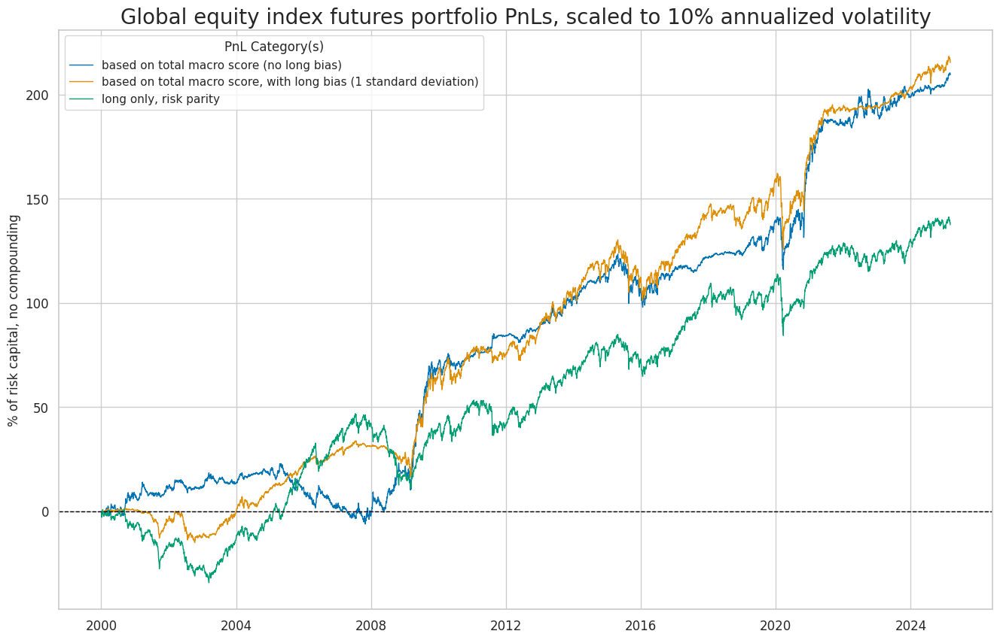

In [56]:
dix = dict_deq_gm

start = dix["start"]
cidx = dix["cidx"]
sigx = [dix["sigs"][0]]

naive_pnl = dix["pnls"]
vers = ["_RAW", "_RAWLB1"]
pnls = [s + v for s in sigx for v in vers] + ["Long only"]

desc = [
    "based on total macro score (no long bias)",
    "based on total macro score, with long bias (1 standard deviation)",
    "long only, risk parity",
    
]

labels = {key: desc for key, desc in zip(pnls, desc)}

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Global equity index futures portfolio PnLs, scaled to 10% annualized volatility",
    xcat_labels=labels,
    figsize=(16, 10),
)

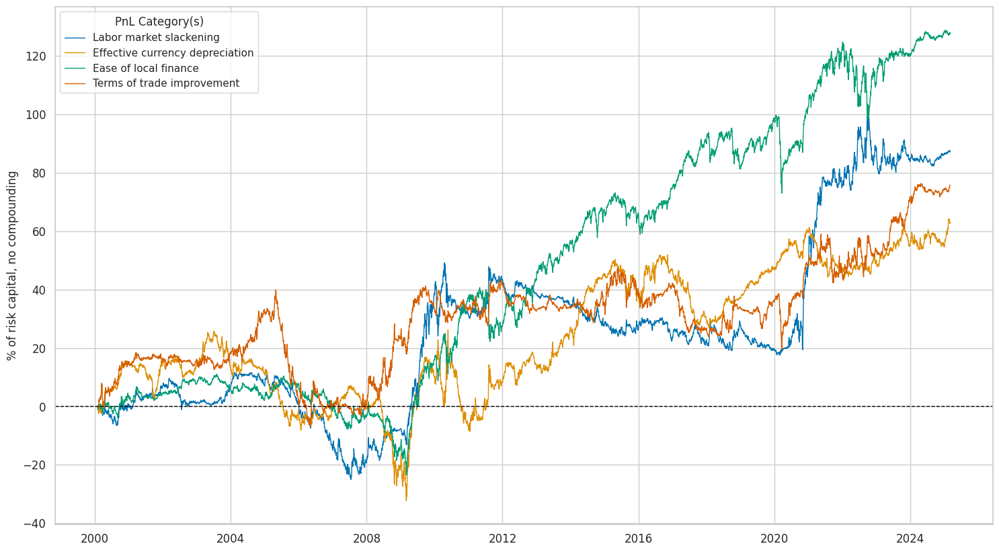

In [57]:
dix = dict_deq_gm

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["sigs"][2:]

lab={key + "_RAW": value for key, value in dict_themes.items()}
labels = dict(list(lab.items())[2:])

naive_pnl = dix["pnls"]
pnls = [s + "_RAW" for s in sigx]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=None,
    xcat_labels=labels,
    figsize=(18, 10),
)

In [58]:
dix = dict_deq_gm
start = dix["start"]
sigx = dix["sigs"]
naive_pnl = dix["pnls"]

pnls = [sig + "_RAW" for sig in sigx] + ["ALL_MACRO_ZN_RAWLB1", "Long only"]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)

labels={key + "_RAW": value for key, value in dict_themes.items()}
labels['ALL_MACRO_ZN_RAWLB1'] = 'All macro, long bias (1std)'

df_eval = df_eval.rename(columns=labels)

display(df_eval.transpose().astype("float").round(3))

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,,,
All macro themes,8.347,10.0,0.835,1.221,-24.177,-18.545,-29.023,0.691,0.102,303.0
Inflation shortfall,6.028,10.0,0.603,0.873,-20.401,-24.297,-35.748,0.934,-0.090,303.0
Labor market slackening,3.471,10.0,0.347,0.516,-17.756,-16.430,-36.636,1.599,-0.118,303.0
Effective currency depreciation,2.512,10.0,0.251,0.365,-16.137,-28.806,-58.086,1.755,0.067,303.0
Ease of local finance,5.078,10.0,0.508,0.705,-25.251,-22.692,-34.557,0.892,0.350,303.0
Terms of trade improvement,3.021,10.0,0.302,0.443,-18.676,-30.220,-46.797,1.656,0.038,303.0
"All macro, long bias (1std)",8.582,10.0,0.858,1.195,-33.660,-22.771,-36.671,0.536,0.484,303.0
Long only,5.460,10.0,0.546,0.742,-26.714,-26.876,-35.847,0.634,0.602,303.0


### DM directional futures strategy

This section deals with the same global directional futures strategy as above, but just for developed markets.

#### Specs and panel test


In [59]:
dict_deq_dm = {
    "sigs": macroz,
    "targs": ["EQXR_NSA", "EQXR_VT10"],
    "cidx": cids_dmeq,
    "start": "2000-01-01",
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

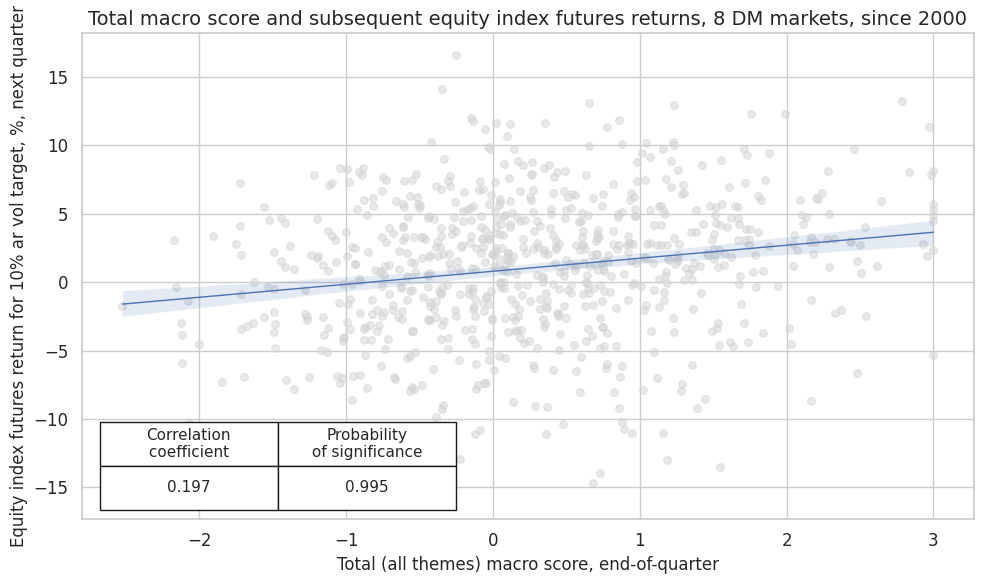

In [60]:
dix = dict_deq_dm

sig = dix["sigs"][0]
targ = dix["targs"][1]
blax = dix["black"]
cidx = dix["cidx"]
start = dix["start"]

cr = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
cr.reg_scatter(
    labels=False,
    coef_box="lower left",
    title="Total macro score and subsequent equity index futures returns, 8 DM markets, since 2000",
    xlab="Total (all themes) macro score, end-of-quarter",
    ylab="Equity index futures return for 10% ar vol target, %, next quarter",
    size=(10, 6),
    prob_est="map",
)

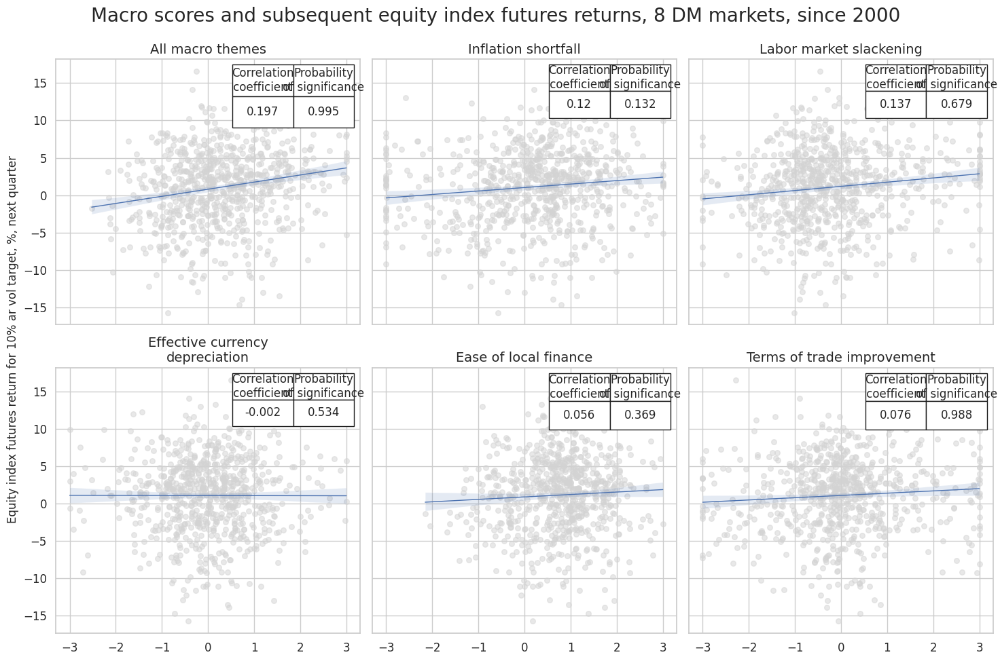

In [61]:
dix = dict_deq_dm

sigs = dix["sigs"]
targ = dix["targs"][1]
blax = dix["black"]
cidx = dix["cidx"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title="Macro scores and subsequent equity index futures returns, 8 DM markets, since 2000",
    ylab="Equity index futures return for 10% ar vol target, %, next quarter",
    ncol=3,
    nrow=2,
    figsize=(15, 10),
    prob_est="map",
    coef_box="upper right",
    subplot_titles=[dict_themes[k] for k in crs_keys],
)

#### Accuracy and correlation check

In [62]:
dix = dict_deq_dm

sigx = dix["sigs"]
targx = dix["targs"]
cidx = dix["cidx"]
start = dix["start"]
blax = dix["black"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [63]:
dix = dict_deq_dm

srr = dix["srr"]

display(srr.multiple_relations_table().astype("float").round(3))



accuracy  bal_accuracy  \
Return    Signal       Frequency Aggregation                           
EQXR_NSA  ALL_MACRO_ZN M         last            0.556         0.540   
          EASE_FIN_ZN  M         last            0.586         0.535   
          FX_DEPREC_ZN M         last            0.492         0.496   
          LAB_SLACK_ZN M         last            0.475         0.504   
          TOT_POYA_ZN  M         last            0.523         0.527   
          XINF_NEG_ZN  M         last            0.563         0.540   
EQXR_VT10 ALL_MACRO_ZN M         last            0.556         0.540   
          EASE_FIN_ZN  M         last            0.586         0.536   
          FX_DEPREC_ZN M         last            0.493         0.496   
          LAB_SLACK_ZN M         last            0.476         0.504   
          TOT_POYA_ZN  M         last            0.522         0.527   
          XINF_NEG_ZN  M         last            0.564         0.541   

                                              pos_sigr  pos_retr  pos_prec  \
Return    Signal       Frequency Aggregation                                 
EQXR_NSA  ALL_MACRO_ZN M         last            0.583     0.603     0.636   
          EASE_FIN_ZN  M         last            0.801     0.605     0.620   
          FX_DEPREC_ZN M         last            0.484     0.603     0.598   
          LAB_SLACK_ZN M         last            0.362     0.603     0.607   
          TOT_POYA_ZN  M         last            0.480     0.603     0.631   
          XINF_NEG_ZN  M         last            0.619     0.605     0.635   
EQXR_VT10 ALL_MACRO_ZN M         last            0.583     0.603     0.637   
          EASE_FIN_ZN  M         last            0.801     0.606     0.620   
          FX_DEPREC_ZN M         last            0.484     0.603     0.599   
          LAB_SLACK_ZN M         last            0.362     0.603     0.609   
          TOT_POYA_ZN  M         last            0.480     0.604     0.631   
          XINF_NEG_ZN  M         last            0.619     0.605     0.636   

                                              neg_prec  pearson  pearson_pval  \
Return    Signal       Frequency Aggregation                                    
EQXR_NSA  ALL_MACRO_ZN M         last            0.444    0.142         0.000   
          EASE_FIN_ZN  M         last            0.451    0.050         0.017   
          FX_DEPREC_ZN M         last            0.393    0.006         0.777   
          LAB_SLACK_ZN M         last            0.400    0.081         0.000   
          TOT_POYA_ZN  M         last            0.423    0.054         0.009   
          XINF_NEG_ZN  M         last            0.445    0.100         0.000   
EQXR_VT10 ALL_MACRO_ZN M         last            0.444    0.118         0.000   
          EASE_FIN_ZN  M         last            0.451    0.023         0.269   
          FX_DEPREC_ZN M         last            0.393   -0.003         0.869   
          LAB_SLACK_ZN M         last            0.400    0.072         0.001   
          TOT_POYA_ZN  M         last            0.422    0.056         0.007   
          XINF_NEG_ZN  M         last            0.445    0.083         0.000   

                                              kendall  kendall_pval    auc  
Return    Signal       Frequency Aggregation                                
EQXR_NSA  ALL_MACRO_ZN M         last           0.083         0.000  0.541  
          EASE_FIN_ZN  M         last           0.034         0.015  0.524  
          FX_DEPREC_ZN M         last          -0.003         0.853  0.495  
          LAB_SLACK_ZN M         last           0.044         0.001  0.504  
          TOT_POYA_ZN  M         last           0.036         0.010  0.528  
          XINF_NEG_ZN  M         last           0.064         0.000  0.540  
EQXR_VT10 ALL_MACRO_ZN M         last           0.069         0.000  0.541  
          EASE_FIN_ZN  M         last           0.012         0.375  0.524  
          FX_DEPREC_ZN M         last  

#### Naive PnL

In [64]:
dix = dict_deq_dm

sigx = dix["sigs"]
targ = dix["targs"][1]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="raw",
        sig_add=0,
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig+"_RAW"
    )

for sig in sigx[:2]:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="raw",
        sig_add=1, # long bias, 1 standard deviation
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig+"_RAWLB1"
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = naive_pnl

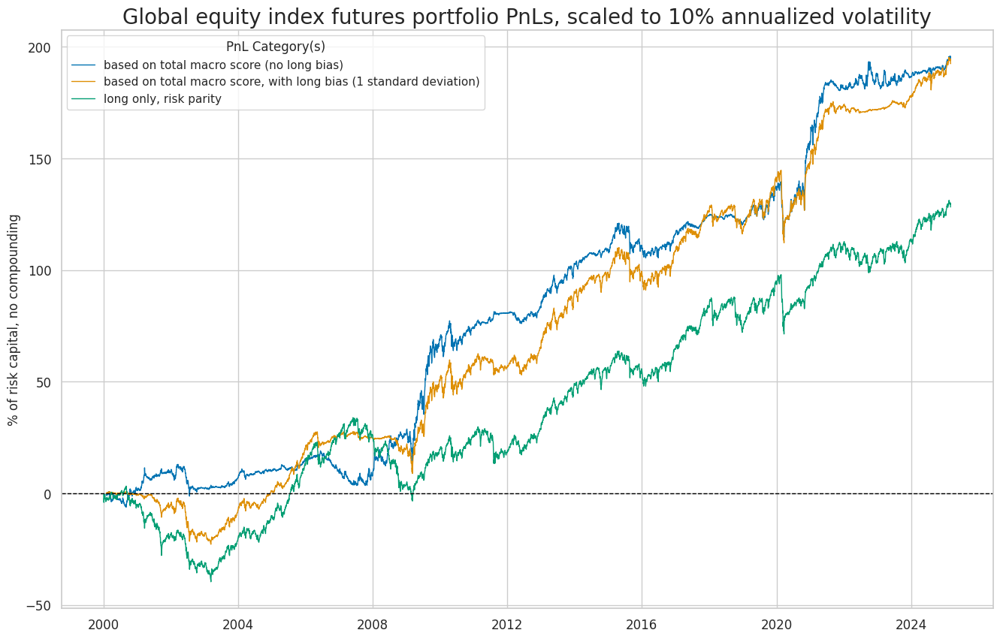

In [65]:
dix = dict_deq_dm

start = dix["start"]
cidx = dix["cidx"]
sigx = [dix["sigs"][0]]

naive_pnl = dix["pnls"]
vers = ["_RAW", "_RAWLB1"]
pnls = [s + v for s in sigx for v in vers] + ["Long only"]

desc = [
    "based on total macro score (no long bias)",
    "based on total macro score, with long bias (1 standard deviation)",
    "long only, risk parity",
    
]

labels = {key: desc for key, desc in zip(pnls, desc)}


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Global equity index futures portfolio PnLs, scaled to 10% annualized volatility",
    xcat_labels=labels,
    figsize=(16, 10),
)

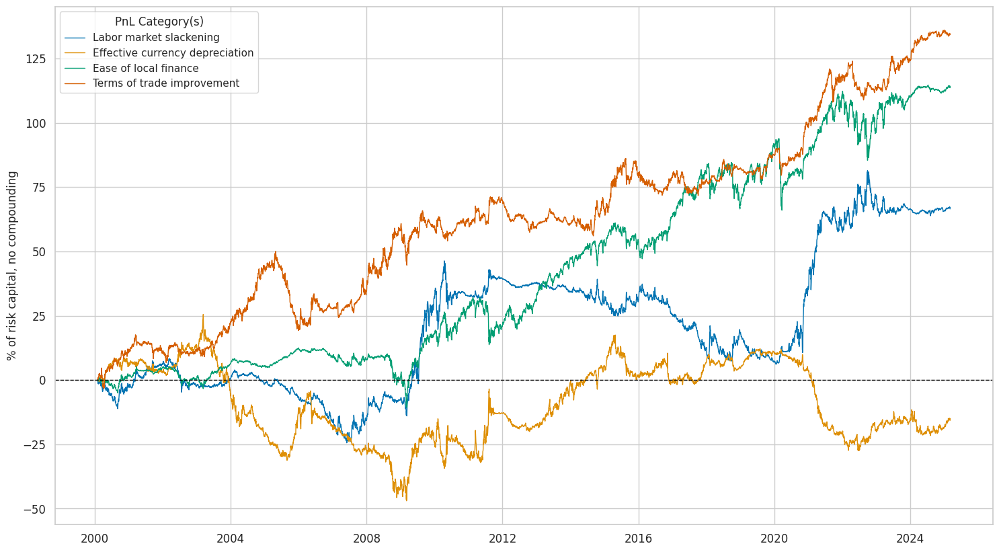

In [66]:
dix = dict_deq_dm

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["sigs"][2:]

naive_pnl = dix["pnls"]
pnls = [s + "_RAW" for s in sigx]

lab={key + "_RAW": value for key, value in dict_themes.items()}
labels = dict(list(lab.items())[2:])

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=None,
    xcat_labels=labels,
    figsize=(18, 10),
)

In [67]:
dix = dict_deq_dm
start = dix["start"]
sigx = dix["sigs"]
naive_pnl = dix["pnls"]

pnls = [sig + "_RAW" for sig in sigx] + ["ALL_MACRO_ZN_RAWLB1", "Long only"]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)

labels={key + "_RAW": value for key, value in dict_themes.items()}
labels['ALL_MACRO_ZN_RAWLB1'] = 'All macro, long bias (1std)'

df_eval = df_eval.rename(columns=labels)

display(df_eval.transpose().astype("float").round(3))

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,,,
All macro themes,7.746,10.0,0.775,1.129,-24.161,-14.288,-24.902,0.687,0.228,303.0
Inflation shortfall,5.138,10.0,0.514,0.736,-17.727,-25.448,-35.705,0.950,0.006,303.0
Labor market slackening,2.651,10.0,0.265,0.395,-17.709,-14.816,-40.210,1.981,-0.079,303.0
Effective currency depreciation,-0.625,10.0,-0.063,-0.089,-12.747,-24.269,-72.464,-5.562,0.001,303.0
Ease of local finance,4.529,10.0,0.453,0.623,-26.918,-21.745,-27.861,0.852,0.513,303.0
Terms of trade improvement,5.362,10.0,0.536,0.789,-12.102,-24.126,-30.799,0.800,0.004,303.0
"All macro, long bias (1std)",7.672,10.0,0.767,1.072,-31.466,-18.845,-32.520,0.544,0.548,303.0
Long only,5.097,10.0,0.510,0.696,-25.683,-21.195,-42.838,0.640,0.637,303.0


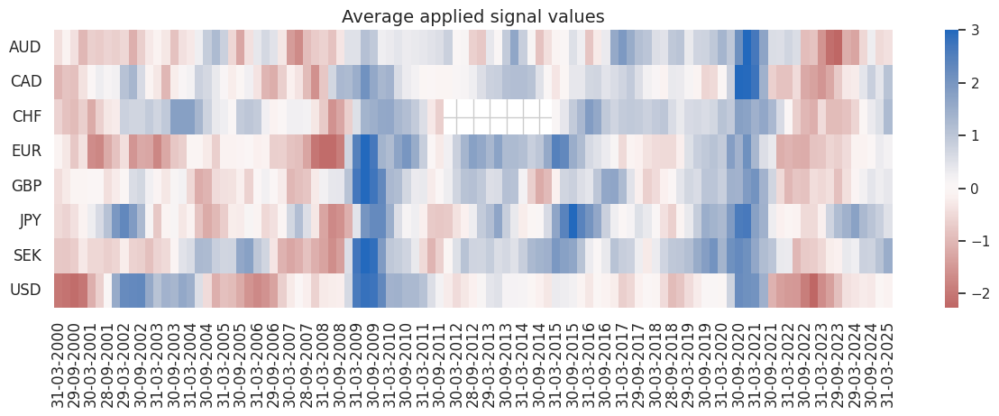

In [68]:
dix = dict_deq_dm
cidx = dix["cidx"]
sig = dix["sigs"][0]
start = dix["start"]

naive_pnl.signal_heatmap(
    pnl_name=sig + "_RAW",
    pnl_cids=cidx,
    freq="q",
    start=start,
    figsize=(15, 4),
)

### Global relative futures strategy


This section examines global relative value signals.

#### Specs and panel test

In [69]:
dict_req_gm = {
    "sigs": macroz_vgm,
    "targs": ["EQXR_VT10vGM"],
    "cidx": cids_eqxx,
    "start": "2000-01-01",
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

# For labelling
dict_themes_vgm = {
    key + "vGM": value + " (relative)" for key, value in dict_themes.items()
}

LAB_SLACK_ZNvGM misses: ['INR'].


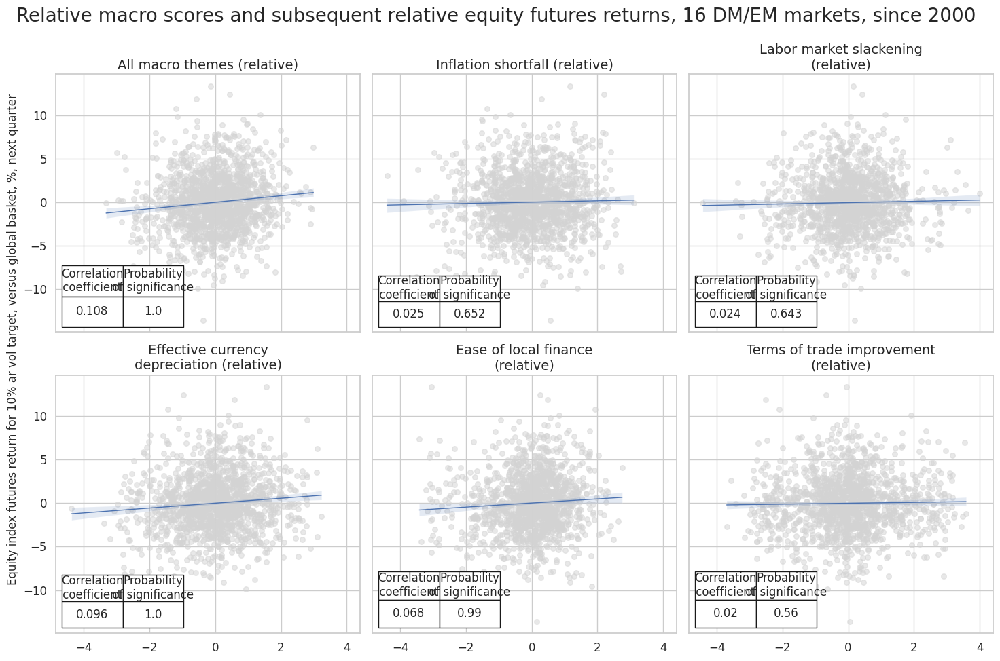

In [70]:
dix = dict_req_gm

sigs = dix["sigs"]
targ = dix["targs"][0]
blax = dix["black"]
cidx = dix["cidx"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title="Relative macro scores and subsequent relative equity futures returns, 16 DM/EM markets, since 2000",
    ylab="Equity index futures return for 10% ar vol target, versus global basket, %, next quarter",
    ncol=3,
    nrow=2,
    figsize=(15, 10),
    prob_est="map",
    coef_box="lower left",
    subplot_titles=[dict_themes_vgm[k] for k in crs_keys],
)

#### Accuracy and correlation check

In [71]:
dix = dict_req_gm

sigx = dix["sigs"]
targx = dix["targs"]
cidx = dix["cidx"]
start = dix["start"]
blax = dix["black"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [72]:
dix = dict_req_gm
srr = dix["srr"]

display(srr.multiple_relations_table().astype("float").round(3))

accuracy  bal_accuracy  \
Return       Signal          Frequency Aggregation                           
EQXR_VT10vGM ALL_MACRO_ZNvGM M         last            0.512         0.512   
             EASE_FIN_ZNvGM  M         last            0.519         0.519   
             FX_DEPREC_ZNvGM M         last            0.518         0.518   
             LAB_SLACK_ZNvGM M         last            0.499         0.500   
             TOT_POYA_ZNvGM  M         last            0.509         0.509   
             XINF_NEG_ZNvGM  M         last            0.507         0.507   

                                                    pos_sigr  pos_retr  \
Return       Signal          Frequency Aggregation                       
EQXR_VT10vGM ALL_MACRO_ZNvGM M         last            0.513     0.494   
             EASE_FIN_ZNvGM  M         last            0.550     0.495   
             FX_DEPREC_ZNvGM M         last            0.499     0.494   
             LAB_SLACK_ZNvGM M         last            0.521     0.493   
             TOT_POYA_ZNvGM  M         last            0.497     0.494   
             XINF_NEG_ZNvGM  M         last            0.484     0.495   

                                                    pos_prec  neg_prec  \
Return       Signal          Frequency Aggregation                       
EQXR_VT10vGM ALL_MACRO_ZNvGM M         last            0.506     0.519   
             EASE_FIN_ZNvGM  M         last            0.512     0.526   
             FX_DEPREC_ZNvGM M         last            0.512     0.524   
             LAB_SLACK_ZNvGM M         last            0.492     0.507   
             TOT_POYA_ZNvGM  M         last            0.503     0.515   
             XINF_NEG_ZNvGM  M         last            0.502     0.512   

                                                    pearson  pearson_pval  \
Return       Signal          Frequency Aggregation                          
EQXR_VT10vGM ALL_MACRO_ZNvGM M         last           0.063         0.000   
             EASE_FIN_ZNvGM  M         last           0.043         0.005   
             FX_DEPREC_ZNvGM M         last           0.051         0.001   
             LAB_SLACK_ZNvGM M         last           0.005         0.746   
             TOT_POYA_ZNvGM  M         last           0.023         0.123   
             XINF_NEG_ZNvGM  M         last           0.010         0.490   

                                                    kendall  kendall_pval  \
Return       Signal          Frequency Aggregation                          
EQXR_VT10vGM ALL_MACRO_ZNvGM M         last           0.034         0.001   
             EASE_FIN_ZNvGM  M         last           0.028         0.006   
             FX_DEPREC_ZNvGM M         last           0.027         0.007   
             LAB_SLACK_ZNvGM M         last           0.003         0.775   
             TOT_POYA_ZNvGM  M         last           0.016         0.109   
             XINF_NEG_ZNvGM  M         last           0.002         0.828   

                                                      auc  
Return       Signal          Frequency Aggregation         
EQXR_VT10vGM ALL_MACRO_ZNvGM M         last         0.512  
             EASE_FIN_ZNvGM  M         last         0.519  
             FX_DEPREC_ZNvGM M         last         0.518  
             LAB_SLACK_ZNvGM M         last         0.500  
             TOT_POYA_ZNvGM  M         last         0.509  
             XINF_NEG_ZNvGM  M         last         0.507

#### Naive PnL

In [73]:
dix = dict_req_gm

sigx = dix["sigs"]
targ = dix["targs"][0]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="raw",
        sig_add=0,
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig+"_RAW"
    )


dix["pnls"] = naive_pnl

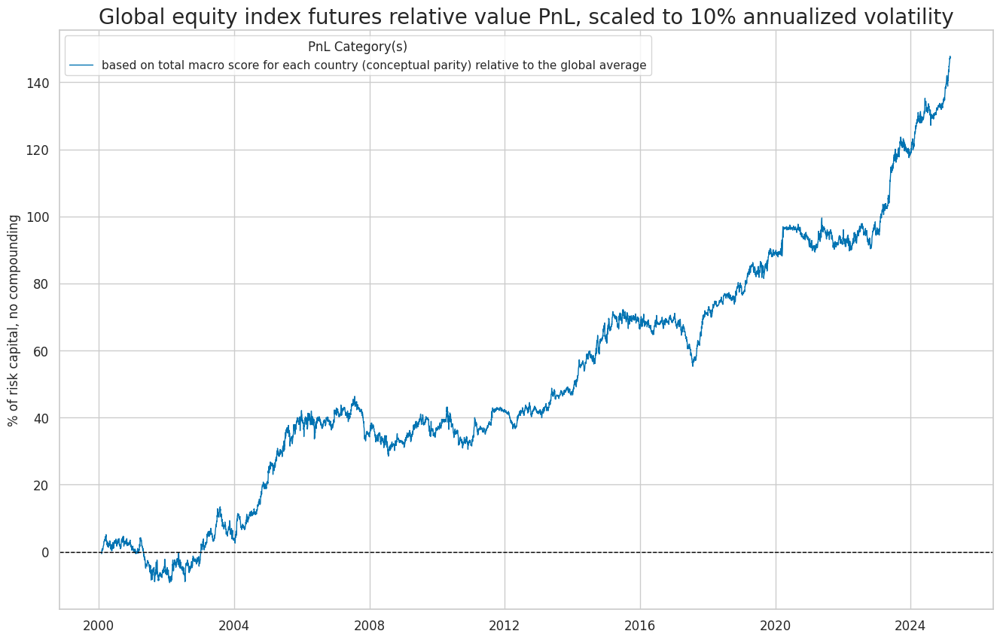

In [74]:
dix = dict_req_gm

start = dix["start"]
cidx = dix["cidx"]
sig = dix["sigs"][0]

naive_pnl = dix["pnls"]
pnls = [sig + "_RAW"]


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Global equity index futures relative value PnL, scaled to 10% annualized volatility",
    xcat_labels=["based on total macro score for each country (conceptual parity) relative to the global average"],
    figsize=(16, 10),
)

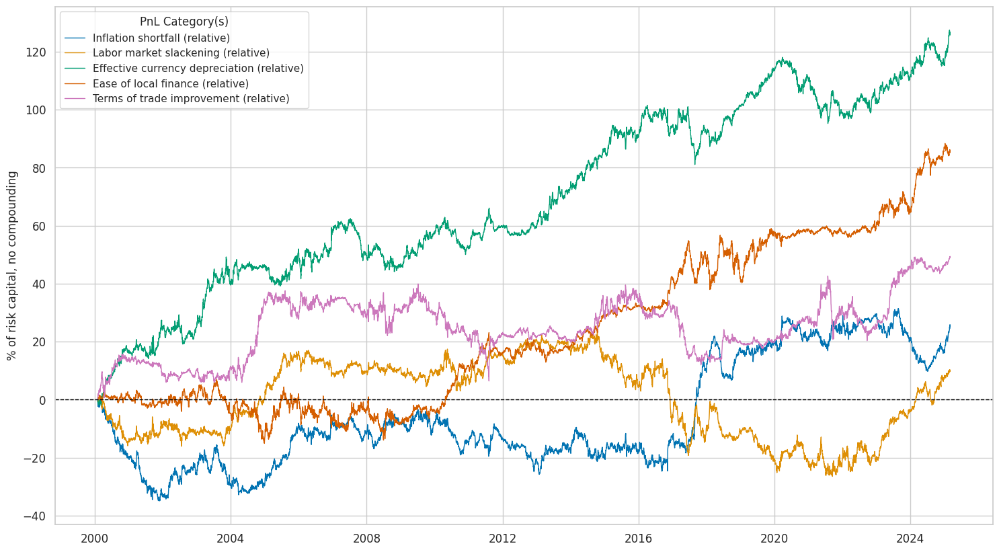

In [75]:
dix = dict_req_gm

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["sigs"][1:]

naive_pnl = dix["pnls"]
pnls = [s + "_RAW" for s in sigx] 

lab={key + "_RAW": value for key, value in dict_themes_vgm.items()}
labels = dict(list(lab.items())[1:])

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=None,
    xcat_labels=labels,
    figsize=(18, 10),
)

In [76]:
dix = dict_req_gm
start = dix["start"]
sigx = dix["sigs"]

naive_pnl = dix["pnls"]
pnls = [sig + "_RAW" for sig in sigx]

labels={key + "_RAW": value for key, value in dict_themes_vgm.items()}


df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
df_eval = df_eval.rename(columns=labels)

display(df_eval.transpose().astype("float").round(3))

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,,,
All macro themes (relative),5.868,10.0,0.587,0.844,-7.794,-12.434,-17.864,0.677,-0.073,303.0
Inflation shortfall (relative),1.010,10.0,0.101,0.146,-8.852,-15.746,-34.854,3.658,-0.087,303.0
Labor market slackening (relative),0.388,10.0,0.039,0.055,-11.929,-22.598,-50.071,7.448,-0.060,303.0
Effective currency depreciation (relative),5.055,10.0,0.506,0.733,-10.037,-18.986,-22.814,0.664,-0.021,303.0
Ease of local finance (relative),3.396,10.0,0.340,0.480,-11.552,-13.704,-21.972,1.021,-0.123,303.0
Terms of trade improvement (relative),1.957,10.0,0.196,0.281,-20.324,-17.854,-33.510,1.976,0.107,303.0


### DM relative futures strategy

Relative equity futures strategy for developed markets

#### Specs and panel test

In [77]:
dict_req_dm = {
    "sigs": macroz_vdm,
    "targs": ["EQXR_VT10vDM"],
    "cidx": cids_dmeq,
    "start": "2000-01-01",
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

# For labelling
dict_themes_vdm = {
    key + "vDM": value + " (relative)" for key, value in dict_themes.items()
}

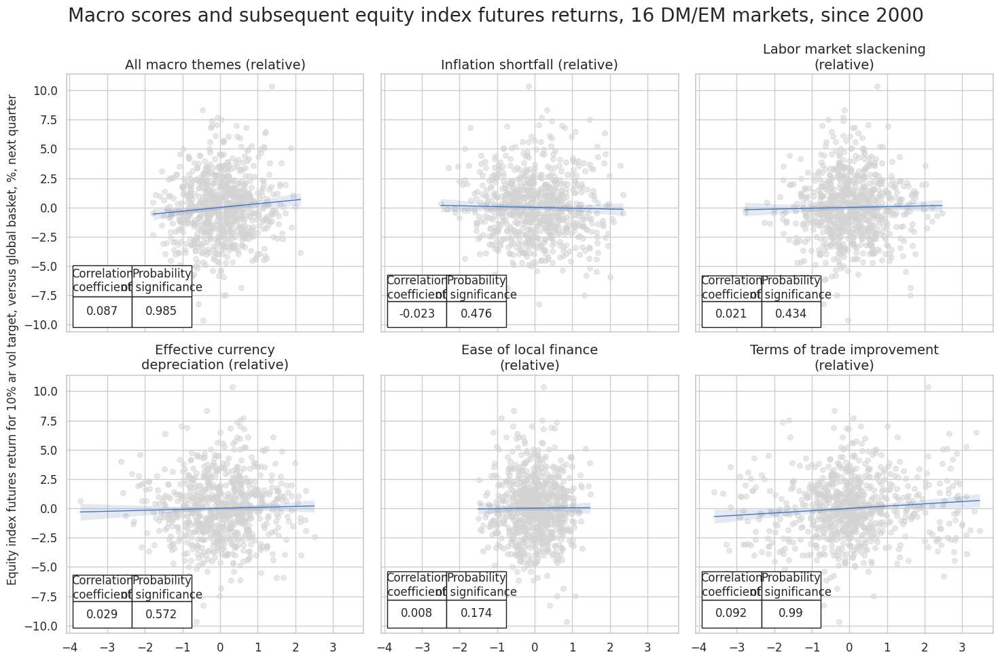

In [78]:
dix = dict_req_dm

sigs = dix["sigs"]
targ = dix["targs"][0]
blax = dix["black"]
cidx = dix["cidx"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title="Macro scores and subsequent equity index futures returns, 16 DM/EM markets, since 2000",
    ylab="Equity index futures return for 10% ar vol target, versus global basket, %, next quarter",
    ncol=3,
    nrow=2,
    figsize=(15, 10),
    prob_est="map",
    coef_box="lower left",
    subplot_titles=[dict_themes_vdm[k] for k in crs_keys],
)

#### Accuracy and correlation check

In [79]:
dix = dict_req_dm

sigx = dix["sigs"]
targx = dix["targs"]
cidx = dix["cidx"]
start = dix["start"]
blax = dix["black"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [80]:
dix = dict_req_dm
srr = dix["srr"]

display(srr.multiple_relations_table().astype("float").round(3))

accuracy  bal_accuracy  \
Return       Signal          Frequency Aggregation                           
EQXR_VT10vDM ALL_MACRO_ZNvDM M         last            0.505         0.505   
             EASE_FIN_ZNvDM  M         last            0.516         0.516   
             FX_DEPREC_ZNvDM M         last            0.498         0.498   
             LAB_SLACK_ZNvDM M         last            0.507         0.507   
             TOT_POYA_ZNvDM  M         last            0.512         0.511   
             XINF_NEG_ZNvDM  M         last            0.497         0.497   

                                                    pos_sigr  pos_retr  \
Return       Signal          Frequency Aggregation                       
EQXR_VT10vDM ALL_MACRO_ZNvDM M         last            0.500     0.498   
             EASE_FIN_ZNvDM  M         last            0.499     0.500   
             FX_DEPREC_ZNvDM M         last            0.503     0.498   
             LAB_SLACK_ZNvDM M         last            0.485     0.498   
             TOT_POYA_ZNvDM  M         last            0.483     0.498   
             XINF_NEG_ZNvDM  M         last            0.483     0.498   

                                                    pos_prec  neg_prec  \
Return       Signal          Frequency Aggregation                       
EQXR_VT10vDM ALL_MACRO_ZNvDM M         last            0.503     0.507   
             EASE_FIN_ZNvDM  M         last            0.516     0.517   
             FX_DEPREC_ZNvDM M         last            0.496     0.500   
             LAB_SLACK_ZNvDM M         last            0.505     0.509   
             TOT_POYA_ZNvDM  M         last            0.510     0.513   
             XINF_NEG_ZNvDM  M         last            0.495     0.499   

                                                    pearson  pearson_pval  \
Return       Signal          Frequency Aggregation                          
EQXR_VT10vDM ALL_MACRO_ZNvDM M         last           0.049         0.019   
             EASE_FIN_ZNvDM  M         last           0.007         0.752   
             FX_DEPREC_ZNvDM M         last           0.008         0.715   
             LAB_SLACK_ZNvDM M         last           0.000         0.987   
             TOT_POYA_ZNvDM  M         last           0.064         0.002   
             XINF_NEG_ZNvDM  M         last          -0.013         0.525   

                                                    kendall  kendall_pval  \
Return       Signal          Frequency Aggregation                          
EQXR_VT10vDM ALL_MACRO_ZNvDM M         last           0.025         0.074   
             EASE_FIN_ZNvDM  M         last           0.011         0.434   
             FX_DEPREC_ZNvDM M         last           0.001         0.963   
             LAB_SLACK_ZNvDM M         last           0.003         0.831   
             TOT_POYA_ZNvDM  M         last           0.036         0.011   
             XINF_NEG_ZNvDM  M         last          -0.011         0.446   

                                                      auc  
Return       Signal          Frequency Aggregation         
EQXR_VT10vDM ALL_MACRO_ZNvDM M         last         0.505  
             EASE_FIN_ZNvDM  M         last         0.516  
             FX_DEPREC_ZNvDM M         last         0.498  
             LAB_SLACK_ZNvDM M         last         0.507  
             TOT_POYA_ZNvDM  M         last         0.511  
             XINF_NEG_ZNvDM  M         last         0.497

#### Naive PnL

In [81]:
dix = dict_req_dm

sigx = dix["sigs"]
targ = dix["targs"][0]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="raw",
        sig_add=0,
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig+"_RAW"
    )


dix["pnls"] = naive_pnl

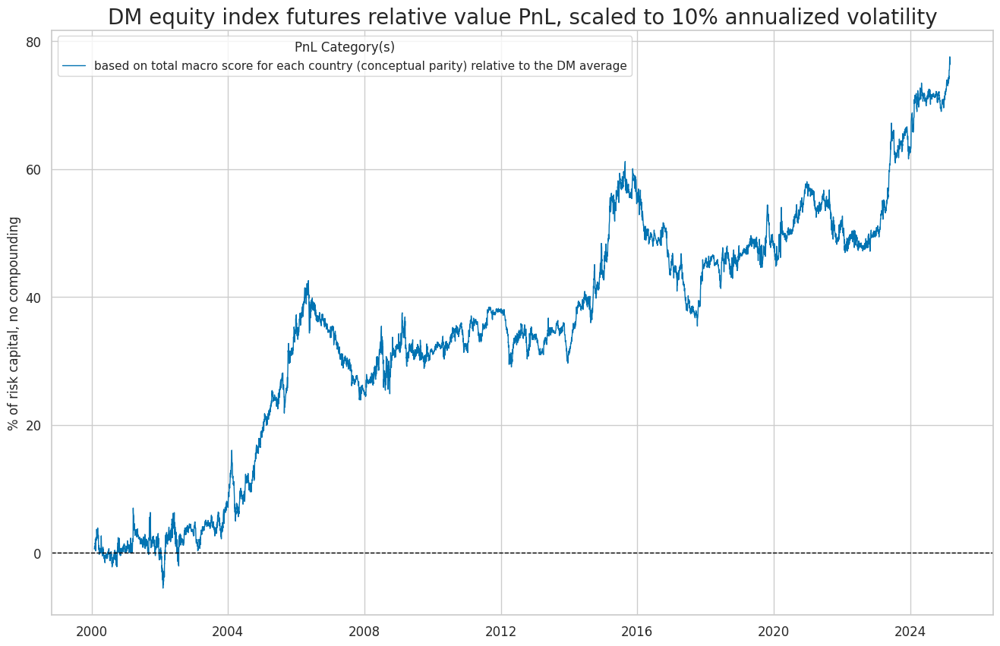

In [82]:
dix = dict_req_dm

start = dix["start"]
cidx = dix["cidx"]
sig = dix["sigs"][0]

naive_pnl = dix["pnls"]
pnls = [sig + "_RAW"]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="DM equity index futures relative value PnL, scaled to 10% annualized volatility",
    xcat_labels=["based on total macro score for each country (conceptual parity) relative to the DM average"],
    figsize=(16, 10),
)

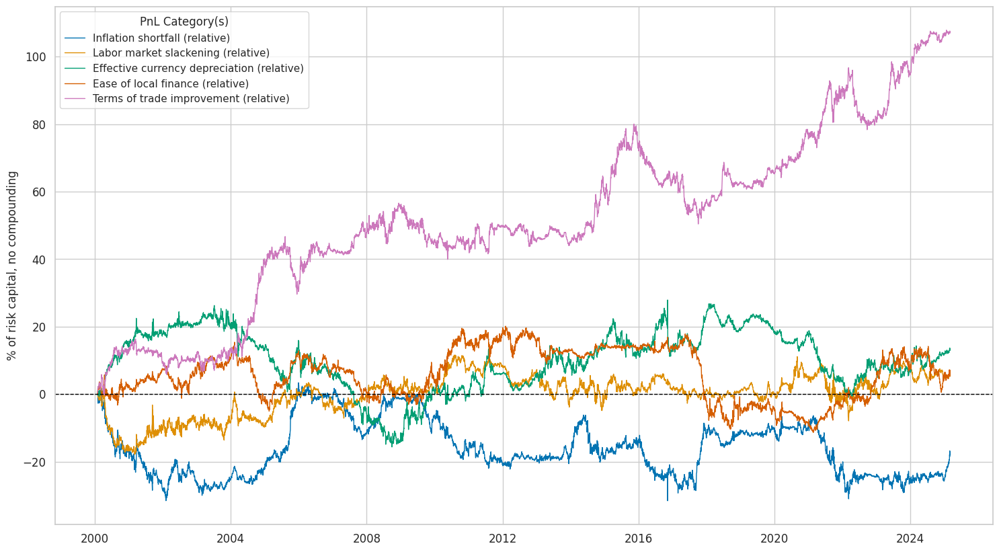

In [83]:
dix = dict_req_dm

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["sigs"][1:]

naive_pnl = dix["pnls"]
pnls = [s + "_RAW" for s in sigx]


lab={key + "_RAW": value for key, value in dict_themes_vdm.items()}
labels = dict(list(lab.items())[1:])


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=None,
    xcat_labels=labels,
    figsize=(18, 10),
)

In [84]:
dix = dict_req_dm
start = dix["start"]
sigx = dix["sigs"]

naive_pnl = dix["pnls"]
pnls = [sig + "_RAW" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)

labels={key + "_RAW": value for key, value in dict_themes_vdm.items()}
df_eval = df_eval.rename(columns=labels)

display(df_eval.transpose().astype("float").round(3))

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,,,
All macro themes (relative),3.046,10.0,0.305,0.440,-9.008,-11.596,-25.763,1.051,-0.078,303.0
Inflation shortfall (relative),-0.714,10.0,-0.071,-0.101,-9.822,-18.099,-34.971,-4.199,-0.120,303.0
Labor market slackening (relative),0.209,10.0,0.021,0.030,-9.868,-15.778,-19.524,12.366,0.008,303.0
Effective currency depreciation (relative),0.515,10.0,0.052,0.073,-14.963,-12.348,-41.931,5.684,-0.020,303.0
Ease of local finance (relative),0.275,10.0,0.028,0.039,-10.405,-20.160,-31.510,9.577,0.061,303.0
Terms of trade improvement (relative),4.272,10.0,0.427,0.621,-11.969,-16.130,-29.590,0.909,-0.028,303.0
